# 02 - Synthetic Stormy Sea Generation

**StormVision**: Generate realistic stormy sea backgrounds while preserving maritime objects.

This notebook implements:
1. SAM-based object mask extraction (with bbox fallback)
2. SDXL inpainting for background-only editing
3. ControlNet depth/edge guidance for geometry preservation
4. Best-of-K candidate selection with quality filters
5. PREVIEW mode for testing without saving

**Key Principle**: Edit ONLY the background (sea/sky), preserve objects completely.

## 1. Imports & Configuration

Load all required libraries and set global configuration parameters.



In [ ]:
import os, json, random
import numpy as np
import pandas as pd
import torch
import cv2
from PIL import Image
from pathlib import Path
from google.colab import drive
from tqdm.auto import tqdm
from collections import defaultdict
import matplotlib.pyplot as plt
import warnings
warnings.filterwarnings('ignore')

SEED = 42
drive.mount('/content/drive')
PROJECT_ROOT = Path('/content/drive/MyDrive/StormVision')

IMG_SIZE = 1024
DEVICE = 'cuda'

PREVIEW = False
PREVIEW_COUNT = 10

NUM_TRAIN_SYNTHETIC = 4000
NUM_TEST_SYNTHETIC = 1739

CHECKPOINT_EVERY = 50
MASK_DILATION_PX = 20

# Image Save Configuration
MAX_RESOLUTION = 1920  # ← זה מה שיש לך עכשיו
SAVE_QUALITY = 90      # JPEG quality
SAVE_FORMAT = 'jpg'

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


## 2. Project Paths Setup

Set up all project directories and create output folders for synthetic images.

**Directory Structure:**


In [ ]:
random.seed(SEED); np.random.seed(SEED); torch.manual_seed(SEED)
if torch.cuda.is_available(): torch.cuda.manual_seed_all(SEED)

PROJECT_ROOT = Path(PROJECT_ROOT).resolve()
DATA_PATH = PROJECT_ROOT / 'data'
TRAIN_IMAGES = DATA_PATH / 'train'
TEST_IMAGES = DATA_PATH / 'val'
ANNOTATIONS = DATA_PATH / 'annotations'

SYNTHETIC_PATH = DATA_PATH / 'synthetic'
SYNTHETIC_TRAIN = SYNTHETIC_PATH / 'train'
SYNTHETIC_TEST = SYNTHETIC_PATH / 'test'
(SYNTHETIC_TRAIN / 'images').mkdir(parents=True, exist_ok=True)
(SYNTHETIC_TEST / 'images').mkdir(parents=True, exist_ok=True)

print(f'Output: {SYNTHETIC_PATH}')

Output: /content/drive/MyDrive/StormVision/data/synthetic


## 3. Load COCO Annotations

Load training and validation annotations from COCO JSON format.

**Process:**
1. Load **instances_train.json** and **instances_val.json**
2. Build category mapping (filter out 'ignored' class)
3. Create image-to-annotations lookup dictionaries
4. Get list of valid image IDs (images with at least one annotation)

In [ ]:
with open(ANNOTATIONS / 'instances_train.json') as f: train_ann = json.load(f)
with open(ANNOTATIONS / 'instances_val.json') as f: test_ann = json.load(f)

CATEGORIES = {cat['id']: cat['name'] for cat in train_ann['categories']}

TRAIN_IMG_INFO = {img['id']: img for img in train_ann['images']}
TRAIN_IMG_TO_ANNS = defaultdict(list)
for ann in train_ann['annotations']:
    if CATEGORIES.get(ann['category_id'], '') != 'ignored':
        TRAIN_IMG_TO_ANNS[ann['image_id']].append(ann)
train_valid_ids = list(TRAIN_IMG_TO_ANNS.keys())

TEST_IMG_INFO = {img['id']: img for img in test_ann['images']}
TEST_IMG_TO_ANNS = defaultdict(list)
for ann in test_ann['annotations']:
    if CATEGORIES.get(ann['category_id'], '') != 'ignored':
        TEST_IMG_TO_ANNS[ann['image_id']].append(ann)
test_valid_ids = list(TEST_IMG_TO_ANNS.keys())

print(f'Train: {len(train_valid_ids)}, Test: {len(test_valid_ids)}')

Train: 8930, Test: 1547


## 4. Enhanced Storm Prompts

Define optimized text prompts for SDXL inpainting to generate realistic stormy sea backgrounds.

**Prompt Strategy:**
- Describe violent storm conditions (4-5 meter waves)
- Include visual elements: foam, spray, dark clouds, rain
- Specify photorealistic quality and drone perspective

**Negative Prompt:**
- Exclude calm conditions, land elements, and artifacts
- Prevent generation of extra objects (rocks, debris, extra people)

In [ ]:
# Enhanced storm prompts
STORM_PROMPTS = [
    "extremely rough stormy ocean, violent 4-5 meter breaking waves, heavy white foam and spray everywhere, dark threatening storm clouds, torrential rain, hurricane force winds, aerial drone footage, photorealistic, 8k, high detail",
    "severe maritime storm, massive churning waves with intense foam, water surface completely covered in whitecaps, very dark overcast sky, powerful wind spray, dangerous sea conditions, professional drone photography",
    "furious tempest at sea, enormous breaking waves, thick foam crests covering ocean, heavy rain and mist, extreme weather conditions, cinematic storm documentation, hyperrealistic water texture",
    "violent ocean storm, rough turbulent waves 3-4 meters high, sea foam flying in the wind, dramatic dark clouds, rain streaks visible, maritime emergency conditions, aerial view, photorealistic",
    "intense storm at sea, aggressive wave patterns, massive amounts of white foam, grey-green turbulent water, low visibility from rain, strong wind effects on water surface, drone camera, realistic lighting"
]

NEGATIVE_PROMPT = (
    "cartoon, painting, drawing, sketch, illustration, anime, lowres, jpeg artifacts, blurry, "
    "warped boat, deformed person, extra limbs, unrealistic textures, "
    "oversaturated, unnatural colors, text, watermark, logo, "
    "distorted objects, missing limbs, bad anatomy, CGI, rendered, "
    "calm water, peaceful sea, flat water, sunny day, clear sky, blue sky, "
    "rocks, debris, stones, boulders, islands, land, beach, shore, coastline, cliff, "
    "extra people, extra boats, extra objects, floating debris, seaweed, trash"
)

print('[OK] Prompts loaded')

[OK] Prompts loaded


## 5. Install & Download SAM

Download the Segment Anything Model (SAM) checkpoint and install the library.

**Model:** SAM ViT-H (largest, most accurate)
- Checkpoint: `sam_vit_h_4b8939.pth` (~2.5GB)
- Source: Meta AI (Facebook Research)

In [ ]:
%%capture
!mkdir -p {PROJECT_ROOT}/models
!wget -nc -q https://dl.fbaipublicfiles.com/segment_anything/sam_vit_h_4b8939.pth -P {PROJECT_ROOT}/models/
!pip install -q git+https://github.com/facebookresearch/segment-anything.git

## 6. Load SAM Model

Initialize the Segment Anything Model for precise object segmentation.

**Purpose:** Create pixel-level masks for objects (swimmers, boats) to protect them during background generation.

In [ ]:
from segment_anything import sam_model_registry, SamPredictor

SAM_CKPT = PROJECT_ROOT / 'models' / 'sam_vit_h_4b8939.pth'
if SAM_CKPT.exists():
    sam = sam_model_registry['vit_h'](checkpoint=str(SAM_CKPT)).to(DEVICE)
    sam_pred = SamPredictor(sam)
    SAM_OK = True
    print('[OK] SAM loaded')
else:
    SAM_OK = False; sam_pred = None

[OK] SAM loaded


## 7. Load SDXL Inpainting + ControlNet

Load the Stable Diffusion XL inpainting pipeline with ControlNet depth conditioning.

**Components:**
| Model | Purpose |
|-------|---------|
| SDXL Base 1.0 | High-quality image generation |
| ControlNet Depth | Maintains scene geometry using depth maps |
| DPM Solver | Fast scheduler (~25 steps) |
| xformers | Memory-efficient attention |

**Fallback:** If ControlNet fails to load, uses vanilla SDXL inpainting.

In [ ]:
from diffusers import StableDiffusionXLInpaintPipeline, ControlNetModel, StableDiffusionXLControlNetInpaintPipeline
from diffusers import DPMSolverMultistepScheduler

print('Loading SDXL + ControlNet...')
try:
    controlnet = ControlNetModel.from_pretrained(
        "diffusers/controlnet-depth-sdxl-1.0", torch_dtype=torch.float16, variant="fp16")
    pipe = StableDiffusionXLControlNetInpaintPipeline.from_pretrained(
        "stabilityai/stable-diffusion-xl-base-1.0", controlnet=controlnet,
        torch_dtype=torch.float16, variant="fp16", use_safetensors=True)
    CONTROLNET_OK = True
    print('[OK] ControlNet loaded')
except Exception as e:
    print(f'ControlNet failed: {e}')
    pipe = StableDiffusionXLInpaintPipeline.from_pretrained(
        "stabilityai/stable-diffusion-xl-base-1.0",
        torch_dtype=torch.float16, variant="fp16", use_safetensors=True)
    CONTROLNET_OK = False

pipe.scheduler = DPMSolverMultistepScheduler.from_config(pipe.scheduler.config)
pipe = pipe.to(DEVICE)

try:
    pipe.enable_xformers_memory_efficient_attention()
    print('[OK] xformers')
except: pass



## 8. Load Depth Estimation Model

Load Intel's DPT-Hybrid model for monocular depth estimation.

**Purpose:** Generate depth maps that guide ControlNet to create waves with realistic geometry matching the original scene.

**Model:** `Intel/dpt-hybrid-midas`

In [ ]:
from transformers import DPTImageProcessor, DPTForDepthEstimation
if CONTROLNET_OK:
    depth_proc = DPTImageProcessor.from_pretrained("Intel/dpt-hybrid-midas")
    depth_model = DPTForDepthEstimation.from_pretrained("Intel/dpt-hybrid-midas").to(DEVICE)
    print('[OK] Depth model')
else:
    depth_proc = depth_model = None

def get_depth(img):
    if not CONTROLNET_OK: return None
    if isinstance(img, np.ndarray): img = Image.fromarray(img)
    inp = depth_proc(images=img, return_tensors="pt").to(DEVICE)
    with torch.no_grad():
        out = depth_model(**inp).predicted_depth
    pred = torch.nn.functional.interpolate(out.unsqueeze(1), size=img.size[::-1], mode="bicubic", align_corners=False)
    arr = pred.squeeze().cpu().numpy()
    return Image.fromarray((arr * 255 / arr.max()).astype(np.uint8))

[OK] Depth model


## 9. Object Mask Generation

Create combined masks for all objects in an image.

**Process:**
1. For each bounding box annotation, use SAM to generate precise segmentation
2. Fall back to padded bounding box if SAM fails
3. Combine all object masks using maximum operation
4. Dilate combined mask by `MASK_DILATION_PX` pixels for safety buffer

**Output:** Binary mask where white (255) = object regions to protect

In [ ]:
def get_masks(img, anns):
    h, w = img.shape[:2]
    combined = np.zeros((h,w), dtype=np.uint8)
    if SAM_OK: sam_pred.set_image(img)
    for ann in anns:
        x,y,bw,bh = ann['bbox']
        if SAM_OK:
            try:
                masks, scores, _ = sam_pred.predict(box=np.array([[x,y,x+bw,y+bh]]), multimask_output=True)
                m = (masks[np.argmax(scores)] * 255).astype(np.uint8)
            except:
                m = np.zeros((h,w), dtype=np.uint8)
                m[int(y):int(y+bh), int(x):int(x+bw)] = 255
        else:
            m = np.zeros((h,w), dtype=np.uint8)
            px, py = int(bw*0.15), int(bh*0.15)
            m[max(0,int(y-py)):min(h,int(y+bh+py)), max(0,int(x-px)):min(w,int(x+bw+px))] = 255
        combined = np.maximum(combined, m)
    kernel = cv2.getStructuringElement(cv2.MORPH_ELLIPSE, (MASK_DILATION_PX, MASK_DILATION_PX))
    combined = cv2.dilate(combined, kernel, iterations=1)
    return combined

## 10. Generate Single Synthetic Image

Core generation function that transforms one image.

**Process:**
1. Resize image and mask to `IMG_SIZE` for SDXL
2. Create inverted background mask (inpaint where mask = white)
3. Generate stormy background using SDXL + ControlNet
4. Resize result back to original dimensions
5. **HARD COPY**: Paste original object pixels back onto generated background


In [ ]:
def generate_single(orig_np, obj_mask, depth_map=None, seed=None):
    """Generate ONE synthetic image (no K selection)"""
    orig_pil = Image.fromarray(orig_np)
    bg_mask = 255 - obj_mask
    mask_pil = Image.fromarray(bg_mask)

    sz = (IMG_SIZE, IMG_SIZE)
    orig_r = orig_pil.resize(sz, Image.Resampling.LANCZOS)
    mask_r = mask_pil.resize(sz, Image.Resampling.NEAREST)
    depth_r = depth_map.resize(sz, Image.Resampling.LANCZOS) if depth_map else None

    seed = seed if seed else random.randint(0, 999999)
    prompt = random.choice(STORM_PROMPTS)
    gen = torch.Generator(device=DEVICE).manual_seed(seed)

    try:
        if CONTROLNET_OK and depth_r:
            res = pipe(
                prompt=prompt, negative_prompt=NEGATIVE_PROMPT,
                image=orig_r, mask_image=mask_r, control_image=depth_r,
                num_inference_steps=25, strength=0.75, guidance_scale=8.0,
                controlnet_conditioning_scale=0.5, generator=gen
            ).images[0]
        else:
            res = pipe(
                prompt=prompt, negative_prompt=NEGATIVE_PROMPT,
                image=orig_r, mask_image=mask_r,
                num_inference_steps=25, strength=0.80, guidance_scale=8.0,
                generator=gen
            ).images[0]

        res = res.resize(orig_pil.size, Image.Resampling.LANCZOS)
        res_np = np.array(res)

        # HARD COPY - Preserve original objects!
        mask_bool = obj_mask > 127
        if len(mask_bool.shape) == 2:
            mask_bool = np.stack([mask_bool] * 3, axis=-1)
        res_np[mask_bool] = orig_np[mask_bool]

        return res_np, seed
    except Exception as e:
        print(f'Gen failed: {e}')
        return None, None

## 11. Image Processing & Visualization

Wrapper function to process a single image ID and visualization helper.

**`process_img`:** Complete pipeline for one image
1. Load image and annotations
2. Generate object masks with SAM
3. Compute depth map (if ControlNet enabled)
4. Generate synthetic stormy version
5. Return result dictionary

**`viz`:** Display original, mask, and synthetic side-by-side

In [ ]:
def process_img(img_id, info_dict, ann_dict, src, out):
    info = info_dict.get(img_id)
    if not info: return None
    anns = ann_dict.get(img_id, [])
    if not anns: return None
    path = src / info['file_name']
    if not path.exists(): return None

    orig = np.array(Image.open(path).convert('RGB'))
    mask = get_masks(orig, anns)
    depth = get_depth(orig) if CONTROLNET_OK else None

    synth, seed = generate_single(orig, mask, depth, seed=SEED+img_id)
    if synth is None: return None

    return {'img_id': img_id, 'file_name': info['file_name'], 'original': orig,
            'synthetic': synth, 'mask': mask, 'seed': seed}

def viz(r):
    fig, ax = plt.subplots(1,3,figsize=(18,6))
    ax[0].imshow(r['original']); ax[0].set_title('Original'); ax[0].axis('off')
    ax[1].imshow(r['mask'], cmap='gray'); ax[1].set_title('Mask'); ax[1].axis('off')
    ax[2].imshow(r['synthetic']); ax[2].set_title(f"Synth (seed: {r['seed']})"); ax[2].axis('off')
    plt.tight_layout(); plt.show()

In [ ]:
# === OPTIMIZED IMAGE SAVE FUNCTION ===
def save_image_optimized(image_array, output_path):
    """
    Save image as JPG with optimized resolution for YOLO training.
    Reduces file size from ~5-8MB to ~300KB.
    """
    from PIL import Image

    img = Image.fromarray(image_array)

    # Resize if larger than max resolution
    w, h = img.size
    if max(w, h) > MAX_RESOLUTION:
        if w > h:
            new_w = MAX_RESOLUTION
            new_h = int(h * MAX_RESOLUTION / w)
        else:
            new_h = MAX_RESOLUTION
            new_w = int(w * MAX_RESOLUTION / h)
        img = img.resize((new_w, new_h), Image.LANCZOS)

    # Ensure RGB mode (no alpha)
    if img.mode == 'RGBA':
        img = img.convert('RGB')

    # Save as JPEG
    img.save(output_path, 'JPEG', quality=SAVE_QUALITY)

    return output_path

print('[OK] save_image_optimized loaded')

## 12. Batch Generation with Checkpointing

Main function to generate multiple synthetic images with progress tracking and automatic checkpointing.

**Features:**
-  **Resume capability**: Skips already-generated images via manifest
-  **Checkpointing**: Saves manifest every `CHECKPOINT_EVERY` images
-  **Preview mode**: Displays images instead of saving (for testing)
-  **Progress bar**: tqdm tracking with ETA

**Output:** CSV manifest with columns:
| Column | Description |
|--------|-------------|
| `original_path` | Path to source image |
| `synthetic_path` | Path to generated image |
| `seed` | Random seed used (for reproducibility) |

In [ ]:
def generate_set(name, src, out, info, anns, ids, num):
    print('='*60 + f'\n {name.upper()}\n' + '='*60)
    manifest_path = out / f'{name.lower()}_manifest.csv'

    existing = set()
    if manifest_path.exists() and not PREVIEW:
        existing = set(Path(p).stem.replace('_synth','') for p in pd.read_csv(manifest_path)['synthetic_path'])
        print(f'[RESUME] {len(existing)} exist')

    sample = random.sample(ids, min(PREVIEW_COUNT if PREVIEW else num or len(ids), len(ids)))
    results, rows = [], []
    if manifest_path.exists() and not PREVIEW:
        rows = pd.read_csv(manifest_path).to_dict('records')

    for img_id in tqdm(sample, desc=name):
        inf = info.get(img_id)
        if inf and Path(inf['file_name']).stem in existing: continue
        r = process_img(img_id, info, anns, src, out)
        if r:
            results.append(r)
            if PREVIEW:
                viz(r)
            else:
                fname = f"{Path(r['file_name']).stem}_synth.jpg"
                fpath = out / 'images' / fname
                save_image_optimized(r['synthetic'], fpath)
                rows.append({
                    'original_path': str(src/r['file_name']),
                    'synthetic_path': str(fpath),
                    'seed': r['seed']
                })
                if len(results) % CHECKPOINT_EVERY == 0:
                    pd.DataFrame(rows).to_csv(manifest_path, index=False)
                    print(f'[CKPT] {len(rows)}')
    print(f'Done: {len(results)}/{len(sample)}')
    return results, rows

## 13. Generate Training Synthetic Images

Run the generation pipeline on training images.


In [ ]:
train_res, train_man = generate_set('Train', TRAIN_IMAGES, SYNTHETIC_TRAIN, TRAIN_IMG_INFO, TRAIN_IMG_TO_ANNS, train_valid_ids, NUM_TRAIN_SYNTHETIC)

 TRAIN
[RESUME] 3000 exist


Train:   0%|          | 0/4000 [00:00<?, ?it/s]

  0%|          | 0/18 [00:00<?, ?it/s]

  0%|          | 0/18 [00:00<?, ?it/s]

  0%|          | 0/18 [00:00<?, ?it/s]

  0%|          | 0/18 [00:00<?, ?it/s]

  0%|          | 0/18 [00:00<?, ?it/s]

  0%|          | 0/18 [00:00<?, ?it/s]

  0%|          | 0/18 [00:00<?, ?it/s]

  0%|          | 0/18 [00:00<?, ?it/s]

  0%|          | 0/18 [00:00<?, ?it/s]

  0%|          | 0/18 [00:00<?, ?it/s]

  0%|          | 0/18 [00:00<?, ?it/s]

  0%|          | 0/18 [00:00<?, ?it/s]

  0%|          | 0/18 [00:00<?, ?it/s]

  0%|          | 0/18 [00:00<?, ?it/s]

  0%|          | 0/18 [00:00<?, ?it/s]

  0%|          | 0/18 [00:00<?, ?it/s]

  0%|          | 0/18 [00:00<?, ?it/s]

  0%|          | 0/18 [00:00<?, ?it/s]

  0%|          | 0/18 [00:00<?, ?it/s]

  0%|          | 0/18 [00:00<?, ?it/s]

  0%|          | 0/18 [00:00<?, ?it/s]

  0%|          | 0/18 [00:00<?, ?it/s]

  0%|          | 0/18 [00:00<?, ?it/s]

  0%|          | 0/18 [00:00<?, ?it/s]

  0%|          | 0/18 [00:00<?, ?it/s]

  0%|          | 0/18 [00:00<?, ?it/s]

  0%|          | 0/18 [00:00<?, ?it/s]

  0%|          | 0/18 [00:00<?, ?it/s]

  0%|          | 0/18 [00:00<?, ?it/s]

  0%|          | 0/18 [00:00<?, ?it/s]

  0%|          | 0/18 [00:00<?, ?it/s]

  0%|          | 0/18 [00:00<?, ?it/s]

  0%|          | 0/18 [00:00<?, ?it/s]

  0%|          | 0/18 [00:00<?, ?it/s]

  0%|          | 0/18 [00:00<?, ?it/s]

  0%|          | 0/18 [00:00<?, ?it/s]

  0%|          | 0/18 [00:00<?, ?it/s]

  0%|          | 0/18 [00:00<?, ?it/s]

  0%|          | 0/18 [00:00<?, ?it/s]

  0%|          | 0/18 [00:00<?, ?it/s]

  0%|          | 0/18 [00:00<?, ?it/s]

  0%|          | 0/18 [00:00<?, ?it/s]

  0%|          | 0/18 [00:00<?, ?it/s]

  0%|          | 0/18 [00:00<?, ?it/s]

  0%|          | 0/18 [00:00<?, ?it/s]

  0%|          | 0/18 [00:00<?, ?it/s]

  0%|          | 0/18 [00:00<?, ?it/s]

  0%|          | 0/18 [00:00<?, ?it/s]

  0%|          | 0/18 [00:00<?, ?it/s]

  0%|          | 0/18 [00:00<?, ?it/s]

[CKPT] 3050


  0%|          | 0/18 [00:00<?, ?it/s]

  0%|          | 0/18 [00:00<?, ?it/s]

  0%|          | 0/18 [00:00<?, ?it/s]

  0%|          | 0/18 [00:00<?, ?it/s]

  0%|          | 0/18 [00:00<?, ?it/s]

  0%|          | 0/18 [00:00<?, ?it/s]

  0%|          | 0/18 [00:00<?, ?it/s]

  0%|          | 0/18 [00:00<?, ?it/s]

  0%|          | 0/18 [00:00<?, ?it/s]

  0%|          | 0/18 [00:00<?, ?it/s]

  0%|          | 0/18 [00:00<?, ?it/s]

  0%|          | 0/18 [00:00<?, ?it/s]

  0%|          | 0/18 [00:00<?, ?it/s]

  0%|          | 0/18 [00:00<?, ?it/s]

  0%|          | 0/18 [00:00<?, ?it/s]

  0%|          | 0/18 [00:00<?, ?it/s]

  0%|          | 0/18 [00:00<?, ?it/s]

  0%|          | 0/18 [00:00<?, ?it/s]

  0%|          | 0/18 [00:00<?, ?it/s]

  0%|          | 0/18 [00:00<?, ?it/s]

  0%|          | 0/18 [00:00<?, ?it/s]

  0%|          | 0/18 [00:00<?, ?it/s]

  0%|          | 0/18 [00:00<?, ?it/s]

  0%|          | 0/18 [00:00<?, ?it/s]

  0%|          | 0/18 [00:00<?, ?it/s]

  0%|          | 0/18 [00:00<?, ?it/s]

  0%|          | 0/18 [00:00<?, ?it/s]

  0%|          | 0/18 [00:00<?, ?it/s]

  0%|          | 0/18 [00:00<?, ?it/s]

  0%|          | 0/18 [00:00<?, ?it/s]

  0%|          | 0/18 [00:00<?, ?it/s]

  0%|          | 0/18 [00:00<?, ?it/s]

  0%|          | 0/18 [00:00<?, ?it/s]

  0%|          | 0/18 [00:00<?, ?it/s]

  0%|          | 0/18 [00:00<?, ?it/s]

  0%|          | 0/18 [00:00<?, ?it/s]

  0%|          | 0/18 [00:00<?, ?it/s]

  0%|          | 0/18 [00:00<?, ?it/s]

  0%|          | 0/18 [00:00<?, ?it/s]

  0%|          | 0/18 [00:00<?, ?it/s]

  0%|          | 0/18 [00:00<?, ?it/s]

  0%|          | 0/18 [00:00<?, ?it/s]

  0%|          | 0/18 [00:00<?, ?it/s]

  0%|          | 0/18 [00:00<?, ?it/s]

  0%|          | 0/18 [00:00<?, ?it/s]

  0%|          | 0/18 [00:00<?, ?it/s]

  0%|          | 0/18 [00:00<?, ?it/s]

  0%|          | 0/18 [00:00<?, ?it/s]

  0%|          | 0/18 [00:00<?, ?it/s]

  0%|          | 0/18 [00:00<?, ?it/s]

[CKPT] 3100


  0%|          | 0/18 [00:00<?, ?it/s]

  0%|          | 0/18 [00:00<?, ?it/s]

  0%|          | 0/18 [00:00<?, ?it/s]

  0%|          | 0/18 [00:00<?, ?it/s]

  0%|          | 0/18 [00:00<?, ?it/s]

  0%|          | 0/18 [00:00<?, ?it/s]

  0%|          | 0/18 [00:00<?, ?it/s]

  0%|          | 0/18 [00:00<?, ?it/s]

  0%|          | 0/18 [00:00<?, ?it/s]

  0%|          | 0/18 [00:00<?, ?it/s]

  0%|          | 0/18 [00:00<?, ?it/s]

  0%|          | 0/18 [00:00<?, ?it/s]

  0%|          | 0/18 [00:00<?, ?it/s]

  0%|          | 0/18 [00:00<?, ?it/s]

  0%|          | 0/18 [00:00<?, ?it/s]

  0%|          | 0/18 [00:00<?, ?it/s]

  0%|          | 0/18 [00:00<?, ?it/s]

  0%|          | 0/18 [00:00<?, ?it/s]

  0%|          | 0/18 [00:00<?, ?it/s]

  0%|          | 0/18 [00:00<?, ?it/s]

  0%|          | 0/18 [00:00<?, ?it/s]

  0%|          | 0/18 [00:00<?, ?it/s]

  0%|          | 0/18 [00:00<?, ?it/s]

  0%|          | 0/18 [00:00<?, ?it/s]

  0%|          | 0/18 [00:00<?, ?it/s]

  0%|          | 0/18 [00:00<?, ?it/s]

  0%|          | 0/18 [00:00<?, ?it/s]

  0%|          | 0/18 [00:00<?, ?it/s]

  0%|          | 0/18 [00:00<?, ?it/s]

  0%|          | 0/18 [00:00<?, ?it/s]

  0%|          | 0/18 [00:00<?, ?it/s]

  0%|          | 0/18 [00:00<?, ?it/s]

  0%|          | 0/18 [00:00<?, ?it/s]

  0%|          | 0/18 [00:00<?, ?it/s]

  0%|          | 0/18 [00:00<?, ?it/s]

  0%|          | 0/18 [00:00<?, ?it/s]

  0%|          | 0/18 [00:00<?, ?it/s]

  0%|          | 0/18 [00:00<?, ?it/s]

  0%|          | 0/18 [00:00<?, ?it/s]

  0%|          | 0/18 [00:00<?, ?it/s]

  0%|          | 0/18 [00:00<?, ?it/s]

  0%|          | 0/18 [00:00<?, ?it/s]

  0%|          | 0/18 [00:00<?, ?it/s]

  0%|          | 0/18 [00:00<?, ?it/s]

  0%|          | 0/18 [00:00<?, ?it/s]

  0%|          | 0/18 [00:00<?, ?it/s]

  0%|          | 0/18 [00:00<?, ?it/s]

  0%|          | 0/18 [00:00<?, ?it/s]

  0%|          | 0/18 [00:00<?, ?it/s]

  0%|          | 0/18 [00:00<?, ?it/s]

[CKPT] 3150


  0%|          | 0/18 [00:00<?, ?it/s]

  0%|          | 0/18 [00:00<?, ?it/s]

  0%|          | 0/18 [00:00<?, ?it/s]

  0%|          | 0/18 [00:00<?, ?it/s]

  0%|          | 0/18 [00:00<?, ?it/s]

  0%|          | 0/18 [00:00<?, ?it/s]

  0%|          | 0/18 [00:00<?, ?it/s]

  0%|          | 0/18 [00:00<?, ?it/s]

  0%|          | 0/18 [00:00<?, ?it/s]

  0%|          | 0/18 [00:00<?, ?it/s]

  0%|          | 0/18 [00:00<?, ?it/s]

  0%|          | 0/18 [00:00<?, ?it/s]

  0%|          | 0/18 [00:00<?, ?it/s]

  0%|          | 0/18 [00:00<?, ?it/s]

  0%|          | 0/18 [00:00<?, ?it/s]

  0%|          | 0/18 [00:00<?, ?it/s]

  0%|          | 0/18 [00:00<?, ?it/s]

  0%|          | 0/18 [00:00<?, ?it/s]

  0%|          | 0/18 [00:00<?, ?it/s]

  0%|          | 0/18 [00:00<?, ?it/s]

  0%|          | 0/18 [00:00<?, ?it/s]

  0%|          | 0/18 [00:00<?, ?it/s]

  0%|          | 0/18 [00:00<?, ?it/s]

  0%|          | 0/18 [00:00<?, ?it/s]

  0%|          | 0/18 [00:00<?, ?it/s]

  0%|          | 0/18 [00:00<?, ?it/s]

  0%|          | 0/18 [00:00<?, ?it/s]

  0%|          | 0/18 [00:00<?, ?it/s]

  0%|          | 0/18 [00:00<?, ?it/s]

  0%|          | 0/18 [00:00<?, ?it/s]

  0%|          | 0/18 [00:00<?, ?it/s]

  0%|          | 0/18 [00:00<?, ?it/s]

  0%|          | 0/18 [00:00<?, ?it/s]

  0%|          | 0/18 [00:00<?, ?it/s]

  0%|          | 0/18 [00:00<?, ?it/s]

  0%|          | 0/18 [00:00<?, ?it/s]

  0%|          | 0/18 [00:00<?, ?it/s]

  0%|          | 0/18 [00:00<?, ?it/s]

  0%|          | 0/18 [00:00<?, ?it/s]

  0%|          | 0/18 [00:00<?, ?it/s]

  0%|          | 0/18 [00:00<?, ?it/s]

  0%|          | 0/18 [00:00<?, ?it/s]

  0%|          | 0/18 [00:00<?, ?it/s]

  0%|          | 0/18 [00:00<?, ?it/s]

  0%|          | 0/18 [00:00<?, ?it/s]

  0%|          | 0/18 [00:00<?, ?it/s]

  0%|          | 0/18 [00:00<?, ?it/s]

  0%|          | 0/18 [00:00<?, ?it/s]

  0%|          | 0/18 [00:00<?, ?it/s]

  0%|          | 0/18 [00:00<?, ?it/s]

[CKPT] 3200


  0%|          | 0/18 [00:00<?, ?it/s]

  0%|          | 0/18 [00:00<?, ?it/s]

  0%|          | 0/18 [00:00<?, ?it/s]

  0%|          | 0/18 [00:00<?, ?it/s]

  0%|          | 0/18 [00:00<?, ?it/s]

  0%|          | 0/18 [00:00<?, ?it/s]

  0%|          | 0/18 [00:00<?, ?it/s]

  0%|          | 0/18 [00:00<?, ?it/s]

  0%|          | 0/18 [00:00<?, ?it/s]

  0%|          | 0/18 [00:00<?, ?it/s]

  0%|          | 0/18 [00:00<?, ?it/s]

  0%|          | 0/18 [00:00<?, ?it/s]

  0%|          | 0/18 [00:00<?, ?it/s]

  0%|          | 0/18 [00:00<?, ?it/s]

  0%|          | 0/18 [00:00<?, ?it/s]

  0%|          | 0/18 [00:00<?, ?it/s]

  0%|          | 0/18 [00:00<?, ?it/s]

  0%|          | 0/18 [00:00<?, ?it/s]

  0%|          | 0/18 [00:00<?, ?it/s]

  0%|          | 0/18 [00:00<?, ?it/s]

  0%|          | 0/18 [00:00<?, ?it/s]

  0%|          | 0/18 [00:00<?, ?it/s]

  0%|          | 0/18 [00:00<?, ?it/s]

  0%|          | 0/18 [00:00<?, ?it/s]

  0%|          | 0/18 [00:00<?, ?it/s]

  0%|          | 0/18 [00:00<?, ?it/s]

  0%|          | 0/18 [00:00<?, ?it/s]

  0%|          | 0/18 [00:00<?, ?it/s]

  0%|          | 0/18 [00:00<?, ?it/s]

  0%|          | 0/18 [00:00<?, ?it/s]

  0%|          | 0/18 [00:00<?, ?it/s]

  0%|          | 0/18 [00:00<?, ?it/s]

  0%|          | 0/18 [00:00<?, ?it/s]

  0%|          | 0/18 [00:00<?, ?it/s]

  0%|          | 0/18 [00:00<?, ?it/s]

  0%|          | 0/18 [00:00<?, ?it/s]

  0%|          | 0/18 [00:00<?, ?it/s]

  0%|          | 0/18 [00:00<?, ?it/s]

  0%|          | 0/18 [00:00<?, ?it/s]

  0%|          | 0/18 [00:00<?, ?it/s]

  0%|          | 0/18 [00:00<?, ?it/s]

  0%|          | 0/18 [00:00<?, ?it/s]

  0%|          | 0/18 [00:00<?, ?it/s]

  0%|          | 0/18 [00:00<?, ?it/s]

  0%|          | 0/18 [00:00<?, ?it/s]

  0%|          | 0/18 [00:00<?, ?it/s]

  0%|          | 0/18 [00:00<?, ?it/s]

  0%|          | 0/18 [00:00<?, ?it/s]

  0%|          | 0/18 [00:00<?, ?it/s]

  0%|          | 0/18 [00:00<?, ?it/s]

[CKPT] 3250


  0%|          | 0/18 [00:00<?, ?it/s]

  0%|          | 0/18 [00:00<?, ?it/s]

  0%|          | 0/18 [00:00<?, ?it/s]

  0%|          | 0/18 [00:00<?, ?it/s]

  0%|          | 0/18 [00:00<?, ?it/s]

  0%|          | 0/18 [00:00<?, ?it/s]

  0%|          | 0/18 [00:00<?, ?it/s]

  0%|          | 0/18 [00:00<?, ?it/s]

  0%|          | 0/18 [00:00<?, ?it/s]

  0%|          | 0/18 [00:00<?, ?it/s]

  0%|          | 0/18 [00:00<?, ?it/s]

  0%|          | 0/18 [00:00<?, ?it/s]

  0%|          | 0/18 [00:00<?, ?it/s]

  0%|          | 0/18 [00:00<?, ?it/s]

  0%|          | 0/18 [00:00<?, ?it/s]

  0%|          | 0/18 [00:00<?, ?it/s]

  0%|          | 0/18 [00:00<?, ?it/s]

  0%|          | 0/18 [00:00<?, ?it/s]

  0%|          | 0/18 [00:00<?, ?it/s]

  0%|          | 0/18 [00:00<?, ?it/s]

  0%|          | 0/18 [00:00<?, ?it/s]

  0%|          | 0/18 [00:00<?, ?it/s]

  0%|          | 0/18 [00:00<?, ?it/s]

  0%|          | 0/18 [00:00<?, ?it/s]

  0%|          | 0/18 [00:00<?, ?it/s]

  0%|          | 0/18 [00:00<?, ?it/s]

  0%|          | 0/18 [00:00<?, ?it/s]

  0%|          | 0/18 [00:00<?, ?it/s]

  0%|          | 0/18 [00:00<?, ?it/s]

  0%|          | 0/18 [00:00<?, ?it/s]

  0%|          | 0/18 [00:00<?, ?it/s]

  0%|          | 0/18 [00:00<?, ?it/s]

  0%|          | 0/18 [00:00<?, ?it/s]

  0%|          | 0/18 [00:00<?, ?it/s]

  0%|          | 0/18 [00:00<?, ?it/s]

  0%|          | 0/18 [00:00<?, ?it/s]

  0%|          | 0/18 [00:00<?, ?it/s]

  0%|          | 0/18 [00:00<?, ?it/s]

  0%|          | 0/18 [00:00<?, ?it/s]

  0%|          | 0/18 [00:00<?, ?it/s]

  0%|          | 0/18 [00:00<?, ?it/s]

  0%|          | 0/18 [00:00<?, ?it/s]

  0%|          | 0/18 [00:00<?, ?it/s]

  0%|          | 0/18 [00:00<?, ?it/s]

  0%|          | 0/18 [00:00<?, ?it/s]

  0%|          | 0/18 [00:00<?, ?it/s]

  0%|          | 0/18 [00:00<?, ?it/s]

  0%|          | 0/18 [00:00<?, ?it/s]

  0%|          | 0/18 [00:00<?, ?it/s]

  0%|          | 0/18 [00:00<?, ?it/s]

[CKPT] 3300


  0%|          | 0/18 [00:00<?, ?it/s]

  0%|          | 0/18 [00:00<?, ?it/s]

  0%|          | 0/18 [00:00<?, ?it/s]

  0%|          | 0/18 [00:00<?, ?it/s]

  0%|          | 0/18 [00:00<?, ?it/s]

  0%|          | 0/18 [00:00<?, ?it/s]

  0%|          | 0/18 [00:00<?, ?it/s]

  0%|          | 0/18 [00:00<?, ?it/s]

  0%|          | 0/18 [00:00<?, ?it/s]

  0%|          | 0/18 [00:00<?, ?it/s]

  0%|          | 0/18 [00:00<?, ?it/s]

  0%|          | 0/18 [00:00<?, ?it/s]

  0%|          | 0/18 [00:00<?, ?it/s]

  0%|          | 0/18 [00:00<?, ?it/s]

  0%|          | 0/18 [00:00<?, ?it/s]

  0%|          | 0/18 [00:00<?, ?it/s]

  0%|          | 0/18 [00:00<?, ?it/s]

  0%|          | 0/18 [00:00<?, ?it/s]

  0%|          | 0/18 [00:00<?, ?it/s]

  0%|          | 0/18 [00:00<?, ?it/s]

  0%|          | 0/18 [00:00<?, ?it/s]

  0%|          | 0/18 [00:00<?, ?it/s]

  0%|          | 0/18 [00:00<?, ?it/s]

  0%|          | 0/18 [00:00<?, ?it/s]

  0%|          | 0/18 [00:00<?, ?it/s]

  0%|          | 0/18 [00:00<?, ?it/s]

  0%|          | 0/18 [00:00<?, ?it/s]

  0%|          | 0/18 [00:00<?, ?it/s]

  0%|          | 0/18 [00:00<?, ?it/s]

  0%|          | 0/18 [00:00<?, ?it/s]

  0%|          | 0/18 [00:00<?, ?it/s]

  0%|          | 0/18 [00:00<?, ?it/s]

  0%|          | 0/18 [00:00<?, ?it/s]

  0%|          | 0/18 [00:00<?, ?it/s]

  0%|          | 0/18 [00:00<?, ?it/s]

  0%|          | 0/18 [00:00<?, ?it/s]

  0%|          | 0/18 [00:00<?, ?it/s]

  0%|          | 0/18 [00:00<?, ?it/s]

  0%|          | 0/18 [00:00<?, ?it/s]

  0%|          | 0/18 [00:00<?, ?it/s]

  0%|          | 0/18 [00:00<?, ?it/s]

  0%|          | 0/18 [00:00<?, ?it/s]

  0%|          | 0/18 [00:00<?, ?it/s]

  0%|          | 0/18 [00:00<?, ?it/s]

  0%|          | 0/18 [00:00<?, ?it/s]

  0%|          | 0/18 [00:00<?, ?it/s]

  0%|          | 0/18 [00:00<?, ?it/s]

  0%|          | 0/18 [00:00<?, ?it/s]

  0%|          | 0/18 [00:00<?, ?it/s]

  0%|          | 0/18 [00:00<?, ?it/s]

[CKPT] 3350


  0%|          | 0/18 [00:00<?, ?it/s]

  0%|          | 0/18 [00:00<?, ?it/s]

  0%|          | 0/18 [00:00<?, ?it/s]

  0%|          | 0/18 [00:00<?, ?it/s]

  0%|          | 0/18 [00:00<?, ?it/s]

  0%|          | 0/18 [00:00<?, ?it/s]

  0%|          | 0/18 [00:00<?, ?it/s]

  0%|          | 0/18 [00:00<?, ?it/s]

  0%|          | 0/18 [00:00<?, ?it/s]

  0%|          | 0/18 [00:00<?, ?it/s]

  0%|          | 0/18 [00:00<?, ?it/s]

  0%|          | 0/18 [00:00<?, ?it/s]

  0%|          | 0/18 [00:00<?, ?it/s]

  0%|          | 0/18 [00:00<?, ?it/s]

  0%|          | 0/18 [00:00<?, ?it/s]

  0%|          | 0/18 [00:00<?, ?it/s]

  0%|          | 0/18 [00:00<?, ?it/s]

  0%|          | 0/18 [00:00<?, ?it/s]

  0%|          | 0/18 [00:00<?, ?it/s]

  0%|          | 0/18 [00:00<?, ?it/s]

  0%|          | 0/18 [00:00<?, ?it/s]

  0%|          | 0/18 [00:00<?, ?it/s]

  0%|          | 0/18 [00:00<?, ?it/s]

  0%|          | 0/18 [00:00<?, ?it/s]

  0%|          | 0/18 [00:00<?, ?it/s]

  0%|          | 0/18 [00:00<?, ?it/s]

  0%|          | 0/18 [00:00<?, ?it/s]

  0%|          | 0/18 [00:00<?, ?it/s]

  0%|          | 0/18 [00:00<?, ?it/s]

  0%|          | 0/18 [00:00<?, ?it/s]

  0%|          | 0/18 [00:00<?, ?it/s]

  0%|          | 0/18 [00:00<?, ?it/s]

  0%|          | 0/18 [00:00<?, ?it/s]

  0%|          | 0/18 [00:00<?, ?it/s]

  0%|          | 0/18 [00:00<?, ?it/s]

  0%|          | 0/18 [00:00<?, ?it/s]

  0%|          | 0/18 [00:00<?, ?it/s]

  0%|          | 0/18 [00:00<?, ?it/s]

  0%|          | 0/18 [00:00<?, ?it/s]

  0%|          | 0/18 [00:00<?, ?it/s]

  0%|          | 0/18 [00:00<?, ?it/s]

  0%|          | 0/18 [00:00<?, ?it/s]

  0%|          | 0/18 [00:00<?, ?it/s]

  0%|          | 0/18 [00:00<?, ?it/s]

  0%|          | 0/18 [00:00<?, ?it/s]

  0%|          | 0/18 [00:00<?, ?it/s]

  0%|          | 0/18 [00:00<?, ?it/s]

  0%|          | 0/18 [00:00<?, ?it/s]

  0%|          | 0/18 [00:00<?, ?it/s]

  0%|          | 0/18 [00:00<?, ?it/s]

[CKPT] 3400


  0%|          | 0/18 [00:00<?, ?it/s]

  0%|          | 0/18 [00:00<?, ?it/s]

  0%|          | 0/18 [00:00<?, ?it/s]

  0%|          | 0/18 [00:00<?, ?it/s]

  0%|          | 0/18 [00:00<?, ?it/s]

  0%|          | 0/18 [00:00<?, ?it/s]

  0%|          | 0/18 [00:00<?, ?it/s]

  0%|          | 0/18 [00:00<?, ?it/s]

  0%|          | 0/18 [00:00<?, ?it/s]

  0%|          | 0/18 [00:00<?, ?it/s]

  0%|          | 0/18 [00:00<?, ?it/s]

  0%|          | 0/18 [00:00<?, ?it/s]

  0%|          | 0/18 [00:00<?, ?it/s]

  0%|          | 0/18 [00:00<?, ?it/s]

  0%|          | 0/18 [00:00<?, ?it/s]

  0%|          | 0/18 [00:00<?, ?it/s]

  0%|          | 0/18 [00:00<?, ?it/s]

  0%|          | 0/18 [00:00<?, ?it/s]

  0%|          | 0/18 [00:00<?, ?it/s]

  0%|          | 0/18 [00:00<?, ?it/s]

  0%|          | 0/18 [00:00<?, ?it/s]

  0%|          | 0/18 [00:00<?, ?it/s]

  0%|          | 0/18 [00:00<?, ?it/s]

  0%|          | 0/18 [00:00<?, ?it/s]

  0%|          | 0/18 [00:00<?, ?it/s]

  0%|          | 0/18 [00:00<?, ?it/s]

  0%|          | 0/18 [00:00<?, ?it/s]

  0%|          | 0/18 [00:00<?, ?it/s]

  0%|          | 0/18 [00:00<?, ?it/s]

  0%|          | 0/18 [00:00<?, ?it/s]

  0%|          | 0/18 [00:00<?, ?it/s]

  0%|          | 0/18 [00:00<?, ?it/s]

  0%|          | 0/18 [00:00<?, ?it/s]

  0%|          | 0/18 [00:00<?, ?it/s]

  0%|          | 0/18 [00:00<?, ?it/s]

  0%|          | 0/18 [00:00<?, ?it/s]

  0%|          | 0/18 [00:00<?, ?it/s]

  0%|          | 0/18 [00:00<?, ?it/s]

  0%|          | 0/18 [00:00<?, ?it/s]

  0%|          | 0/18 [00:00<?, ?it/s]

  0%|          | 0/18 [00:00<?, ?it/s]

  0%|          | 0/18 [00:00<?, ?it/s]

  0%|          | 0/18 [00:00<?, ?it/s]

  0%|          | 0/18 [00:00<?, ?it/s]

  0%|          | 0/18 [00:00<?, ?it/s]

  0%|          | 0/18 [00:00<?, ?it/s]

  0%|          | 0/18 [00:00<?, ?it/s]

  0%|          | 0/18 [00:00<?, ?it/s]

  0%|          | 0/18 [00:00<?, ?it/s]

  0%|          | 0/18 [00:00<?, ?it/s]

[CKPT] 3450


  0%|          | 0/18 [00:00<?, ?it/s]

  0%|          | 0/18 [00:00<?, ?it/s]

  0%|          | 0/18 [00:00<?, ?it/s]

  0%|          | 0/18 [00:00<?, ?it/s]

  0%|          | 0/18 [00:00<?, ?it/s]

  0%|          | 0/18 [00:00<?, ?it/s]

  0%|          | 0/18 [00:00<?, ?it/s]

  0%|          | 0/18 [00:00<?, ?it/s]

  0%|          | 0/18 [00:00<?, ?it/s]

  0%|          | 0/18 [00:00<?, ?it/s]

  0%|          | 0/18 [00:00<?, ?it/s]

  0%|          | 0/18 [00:00<?, ?it/s]

  0%|          | 0/18 [00:00<?, ?it/s]

  0%|          | 0/18 [00:00<?, ?it/s]

  0%|          | 0/18 [00:00<?, ?it/s]

  0%|          | 0/18 [00:00<?, ?it/s]

  0%|          | 0/18 [00:00<?, ?it/s]

  0%|          | 0/18 [00:00<?, ?it/s]

  0%|          | 0/18 [00:00<?, ?it/s]

  0%|          | 0/18 [00:00<?, ?it/s]

  0%|          | 0/18 [00:00<?, ?it/s]

  0%|          | 0/18 [00:00<?, ?it/s]

  0%|          | 0/18 [00:00<?, ?it/s]

  0%|          | 0/18 [00:00<?, ?it/s]

  0%|          | 0/18 [00:00<?, ?it/s]

  0%|          | 0/18 [00:00<?, ?it/s]

  0%|          | 0/18 [00:00<?, ?it/s]

  0%|          | 0/18 [00:00<?, ?it/s]

  0%|          | 0/18 [00:00<?, ?it/s]

  0%|          | 0/18 [00:00<?, ?it/s]

  0%|          | 0/18 [00:00<?, ?it/s]

  0%|          | 0/18 [00:00<?, ?it/s]

  0%|          | 0/18 [00:00<?, ?it/s]

  0%|          | 0/18 [00:00<?, ?it/s]

  0%|          | 0/18 [00:00<?, ?it/s]

  0%|          | 0/18 [00:00<?, ?it/s]

  0%|          | 0/18 [00:00<?, ?it/s]

  0%|          | 0/18 [00:00<?, ?it/s]

  0%|          | 0/18 [00:00<?, ?it/s]

  0%|          | 0/18 [00:00<?, ?it/s]

  0%|          | 0/18 [00:00<?, ?it/s]

  0%|          | 0/18 [00:00<?, ?it/s]

  0%|          | 0/18 [00:00<?, ?it/s]

  0%|          | 0/18 [00:00<?, ?it/s]

  0%|          | 0/18 [00:00<?, ?it/s]

  0%|          | 0/18 [00:00<?, ?it/s]

  0%|          | 0/18 [00:00<?, ?it/s]

  0%|          | 0/18 [00:00<?, ?it/s]

  0%|          | 0/18 [00:00<?, ?it/s]

  0%|          | 0/18 [00:00<?, ?it/s]

[CKPT] 3500


  0%|          | 0/18 [00:00<?, ?it/s]

  0%|          | 0/18 [00:00<?, ?it/s]

  0%|          | 0/18 [00:00<?, ?it/s]

  0%|          | 0/18 [00:00<?, ?it/s]

  0%|          | 0/18 [00:00<?, ?it/s]

  0%|          | 0/18 [00:00<?, ?it/s]

  0%|          | 0/18 [00:00<?, ?it/s]

  0%|          | 0/18 [00:00<?, ?it/s]

  0%|          | 0/18 [00:00<?, ?it/s]

  0%|          | 0/18 [00:00<?, ?it/s]

  0%|          | 0/18 [00:00<?, ?it/s]

  0%|          | 0/18 [00:00<?, ?it/s]

  0%|          | 0/18 [00:00<?, ?it/s]

  0%|          | 0/18 [00:00<?, ?it/s]

  0%|          | 0/18 [00:00<?, ?it/s]

  0%|          | 0/18 [00:00<?, ?it/s]

  0%|          | 0/18 [00:00<?, ?it/s]

  0%|          | 0/18 [00:00<?, ?it/s]

  0%|          | 0/18 [00:00<?, ?it/s]

  0%|          | 0/18 [00:00<?, ?it/s]

  0%|          | 0/18 [00:00<?, ?it/s]

  0%|          | 0/18 [00:00<?, ?it/s]

  0%|          | 0/18 [00:00<?, ?it/s]

  0%|          | 0/18 [00:00<?, ?it/s]

  0%|          | 0/18 [00:00<?, ?it/s]

  0%|          | 0/18 [00:00<?, ?it/s]

  0%|          | 0/18 [00:00<?, ?it/s]

  0%|          | 0/18 [00:00<?, ?it/s]

  0%|          | 0/18 [00:00<?, ?it/s]

  0%|          | 0/18 [00:00<?, ?it/s]

  0%|          | 0/18 [00:00<?, ?it/s]

  0%|          | 0/18 [00:00<?, ?it/s]

  0%|          | 0/18 [00:00<?, ?it/s]

  0%|          | 0/18 [00:00<?, ?it/s]

  0%|          | 0/18 [00:00<?, ?it/s]

  0%|          | 0/18 [00:00<?, ?it/s]

  0%|          | 0/18 [00:00<?, ?it/s]

  0%|          | 0/18 [00:00<?, ?it/s]

  0%|          | 0/18 [00:00<?, ?it/s]

  0%|          | 0/18 [00:00<?, ?it/s]

  0%|          | 0/18 [00:00<?, ?it/s]

  0%|          | 0/18 [00:00<?, ?it/s]

  0%|          | 0/18 [00:00<?, ?it/s]

  0%|          | 0/18 [00:00<?, ?it/s]

  0%|          | 0/18 [00:00<?, ?it/s]

  0%|          | 0/18 [00:00<?, ?it/s]

  0%|          | 0/18 [00:00<?, ?it/s]

  0%|          | 0/18 [00:00<?, ?it/s]

  0%|          | 0/18 [00:00<?, ?it/s]

  0%|          | 0/18 [00:00<?, ?it/s]

[CKPT] 3550


  0%|          | 0/18 [00:00<?, ?it/s]

  0%|          | 0/18 [00:00<?, ?it/s]

  0%|          | 0/18 [00:00<?, ?it/s]

  0%|          | 0/18 [00:00<?, ?it/s]

  0%|          | 0/18 [00:00<?, ?it/s]

  0%|          | 0/18 [00:00<?, ?it/s]

  0%|          | 0/18 [00:00<?, ?it/s]

  0%|          | 0/18 [00:00<?, ?it/s]

  0%|          | 0/18 [00:00<?, ?it/s]

  0%|          | 0/18 [00:00<?, ?it/s]

  0%|          | 0/18 [00:00<?, ?it/s]

  0%|          | 0/18 [00:00<?, ?it/s]

  0%|          | 0/18 [00:00<?, ?it/s]

  0%|          | 0/18 [00:00<?, ?it/s]

  0%|          | 0/18 [00:00<?, ?it/s]

  0%|          | 0/18 [00:00<?, ?it/s]

  0%|          | 0/18 [00:00<?, ?it/s]

  0%|          | 0/18 [00:00<?, ?it/s]

  0%|          | 0/18 [00:00<?, ?it/s]

  0%|          | 0/18 [00:00<?, ?it/s]

  0%|          | 0/18 [00:00<?, ?it/s]

  0%|          | 0/18 [00:00<?, ?it/s]

  0%|          | 0/18 [00:00<?, ?it/s]

  0%|          | 0/18 [00:00<?, ?it/s]

  0%|          | 0/18 [00:00<?, ?it/s]

  0%|          | 0/18 [00:00<?, ?it/s]

  0%|          | 0/18 [00:00<?, ?it/s]

  0%|          | 0/18 [00:00<?, ?it/s]

  0%|          | 0/18 [00:00<?, ?it/s]

  0%|          | 0/18 [00:00<?, ?it/s]

  0%|          | 0/18 [00:00<?, ?it/s]

  0%|          | 0/18 [00:00<?, ?it/s]

  0%|          | 0/18 [00:00<?, ?it/s]

  0%|          | 0/18 [00:00<?, ?it/s]

  0%|          | 0/18 [00:00<?, ?it/s]

  0%|          | 0/18 [00:00<?, ?it/s]

  0%|          | 0/18 [00:00<?, ?it/s]

  0%|          | 0/18 [00:00<?, ?it/s]

  0%|          | 0/18 [00:00<?, ?it/s]

  0%|          | 0/18 [00:00<?, ?it/s]

  0%|          | 0/18 [00:00<?, ?it/s]

  0%|          | 0/18 [00:00<?, ?it/s]

  0%|          | 0/18 [00:00<?, ?it/s]

  0%|          | 0/18 [00:00<?, ?it/s]

  0%|          | 0/18 [00:00<?, ?it/s]

  0%|          | 0/18 [00:00<?, ?it/s]

  0%|          | 0/18 [00:00<?, ?it/s]

  0%|          | 0/18 [00:00<?, ?it/s]

  0%|          | 0/18 [00:00<?, ?it/s]

  0%|          | 0/18 [00:00<?, ?it/s]

[CKPT] 3600


  0%|          | 0/18 [00:00<?, ?it/s]

  0%|          | 0/18 [00:00<?, ?it/s]

  0%|          | 0/18 [00:00<?, ?it/s]

  0%|          | 0/18 [00:00<?, ?it/s]

  0%|          | 0/18 [00:00<?, ?it/s]

  0%|          | 0/18 [00:00<?, ?it/s]

  0%|          | 0/18 [00:00<?, ?it/s]

  0%|          | 0/18 [00:00<?, ?it/s]

  0%|          | 0/18 [00:00<?, ?it/s]

  0%|          | 0/18 [00:00<?, ?it/s]

  0%|          | 0/18 [00:00<?, ?it/s]

  0%|          | 0/18 [00:00<?, ?it/s]

  0%|          | 0/18 [00:00<?, ?it/s]

  0%|          | 0/18 [00:00<?, ?it/s]

  0%|          | 0/18 [00:00<?, ?it/s]

  0%|          | 0/18 [00:00<?, ?it/s]

  0%|          | 0/18 [00:00<?, ?it/s]

  0%|          | 0/18 [00:00<?, ?it/s]

  0%|          | 0/18 [00:00<?, ?it/s]

  0%|          | 0/18 [00:00<?, ?it/s]

  0%|          | 0/18 [00:00<?, ?it/s]

  0%|          | 0/18 [00:00<?, ?it/s]

  0%|          | 0/18 [00:00<?, ?it/s]

  0%|          | 0/18 [00:00<?, ?it/s]

  0%|          | 0/18 [00:00<?, ?it/s]

  0%|          | 0/18 [00:00<?, ?it/s]

  0%|          | 0/18 [00:00<?, ?it/s]

  0%|          | 0/18 [00:00<?, ?it/s]

  0%|          | 0/18 [00:00<?, ?it/s]

  0%|          | 0/18 [00:00<?, ?it/s]

  0%|          | 0/18 [00:00<?, ?it/s]

  0%|          | 0/18 [00:00<?, ?it/s]

  0%|          | 0/18 [00:00<?, ?it/s]

  0%|          | 0/18 [00:00<?, ?it/s]

  0%|          | 0/18 [00:00<?, ?it/s]

  0%|          | 0/18 [00:00<?, ?it/s]

  0%|          | 0/18 [00:00<?, ?it/s]

  0%|          | 0/18 [00:00<?, ?it/s]

  0%|          | 0/18 [00:00<?, ?it/s]

  0%|          | 0/18 [00:00<?, ?it/s]

  0%|          | 0/18 [00:00<?, ?it/s]

  0%|          | 0/18 [00:00<?, ?it/s]

  0%|          | 0/18 [00:00<?, ?it/s]

  0%|          | 0/18 [00:00<?, ?it/s]

  0%|          | 0/18 [00:00<?, ?it/s]

  0%|          | 0/18 [00:00<?, ?it/s]

  0%|          | 0/18 [00:00<?, ?it/s]

  0%|          | 0/18 [00:00<?, ?it/s]

  0%|          | 0/18 [00:00<?, ?it/s]

  0%|          | 0/18 [00:00<?, ?it/s]

[CKPT] 3650


  0%|          | 0/18 [00:00<?, ?it/s]

  0%|          | 0/18 [00:00<?, ?it/s]

  0%|          | 0/18 [00:00<?, ?it/s]

  0%|          | 0/18 [00:00<?, ?it/s]

  0%|          | 0/18 [00:00<?, ?it/s]

  0%|          | 0/18 [00:00<?, ?it/s]

  0%|          | 0/18 [00:00<?, ?it/s]

  0%|          | 0/18 [00:00<?, ?it/s]

  0%|          | 0/18 [00:00<?, ?it/s]

  0%|          | 0/18 [00:00<?, ?it/s]

  0%|          | 0/18 [00:00<?, ?it/s]

  0%|          | 0/18 [00:00<?, ?it/s]

  0%|          | 0/18 [00:00<?, ?it/s]

  0%|          | 0/18 [00:00<?, ?it/s]

  0%|          | 0/18 [00:00<?, ?it/s]

  0%|          | 0/18 [00:00<?, ?it/s]

  0%|          | 0/18 [00:00<?, ?it/s]

  0%|          | 0/18 [00:00<?, ?it/s]

  0%|          | 0/18 [00:00<?, ?it/s]

  0%|          | 0/18 [00:00<?, ?it/s]

  0%|          | 0/18 [00:00<?, ?it/s]

  0%|          | 0/18 [00:00<?, ?it/s]

  0%|          | 0/18 [00:00<?, ?it/s]

  0%|          | 0/18 [00:00<?, ?it/s]

  0%|          | 0/18 [00:00<?, ?it/s]

  0%|          | 0/18 [00:00<?, ?it/s]

  0%|          | 0/18 [00:00<?, ?it/s]

  0%|          | 0/18 [00:00<?, ?it/s]

  0%|          | 0/18 [00:00<?, ?it/s]

  0%|          | 0/18 [00:00<?, ?it/s]

  0%|          | 0/18 [00:00<?, ?it/s]

  0%|          | 0/18 [00:00<?, ?it/s]

  0%|          | 0/18 [00:00<?, ?it/s]

  0%|          | 0/18 [00:00<?, ?it/s]

  0%|          | 0/18 [00:00<?, ?it/s]

  0%|          | 0/18 [00:00<?, ?it/s]

  0%|          | 0/18 [00:00<?, ?it/s]

  0%|          | 0/18 [00:00<?, ?it/s]

  0%|          | 0/18 [00:00<?, ?it/s]

  0%|          | 0/18 [00:00<?, ?it/s]

  0%|          | 0/18 [00:00<?, ?it/s]

  0%|          | 0/18 [00:00<?, ?it/s]

  0%|          | 0/18 [00:00<?, ?it/s]

  0%|          | 0/18 [00:00<?, ?it/s]

  0%|          | 0/18 [00:00<?, ?it/s]

  0%|          | 0/18 [00:00<?, ?it/s]

  0%|          | 0/18 [00:00<?, ?it/s]

  0%|          | 0/18 [00:00<?, ?it/s]

  0%|          | 0/18 [00:00<?, ?it/s]

  0%|          | 0/18 [00:00<?, ?it/s]

[CKPT] 3700


  0%|          | 0/18 [00:00<?, ?it/s]

  0%|          | 0/18 [00:00<?, ?it/s]

  0%|          | 0/18 [00:00<?, ?it/s]

  0%|          | 0/18 [00:00<?, ?it/s]

  0%|          | 0/18 [00:00<?, ?it/s]

  0%|          | 0/18 [00:00<?, ?it/s]

  0%|          | 0/18 [00:00<?, ?it/s]

  0%|          | 0/18 [00:00<?, ?it/s]

  0%|          | 0/18 [00:00<?, ?it/s]

  0%|          | 0/18 [00:00<?, ?it/s]

  0%|          | 0/18 [00:00<?, ?it/s]

  0%|          | 0/18 [00:00<?, ?it/s]

  0%|          | 0/18 [00:00<?, ?it/s]

  0%|          | 0/18 [00:00<?, ?it/s]

  0%|          | 0/18 [00:00<?, ?it/s]

  0%|          | 0/18 [00:00<?, ?it/s]

  0%|          | 0/18 [00:00<?, ?it/s]

  0%|          | 0/18 [00:00<?, ?it/s]

  0%|          | 0/18 [00:00<?, ?it/s]

  0%|          | 0/18 [00:00<?, ?it/s]

  0%|          | 0/18 [00:00<?, ?it/s]

  0%|          | 0/18 [00:00<?, ?it/s]

  0%|          | 0/18 [00:00<?, ?it/s]

  0%|          | 0/18 [00:00<?, ?it/s]

  0%|          | 0/18 [00:00<?, ?it/s]

  0%|          | 0/18 [00:00<?, ?it/s]

  0%|          | 0/18 [00:00<?, ?it/s]

  0%|          | 0/18 [00:00<?, ?it/s]

  0%|          | 0/18 [00:00<?, ?it/s]

  0%|          | 0/18 [00:00<?, ?it/s]

  0%|          | 0/18 [00:00<?, ?it/s]

  0%|          | 0/18 [00:00<?, ?it/s]

  0%|          | 0/18 [00:00<?, ?it/s]

  0%|          | 0/18 [00:00<?, ?it/s]

  0%|          | 0/18 [00:00<?, ?it/s]

  0%|          | 0/18 [00:00<?, ?it/s]

  0%|          | 0/18 [00:00<?, ?it/s]

  0%|          | 0/18 [00:00<?, ?it/s]

  0%|          | 0/18 [00:00<?, ?it/s]

  0%|          | 0/18 [00:00<?, ?it/s]

  0%|          | 0/18 [00:00<?, ?it/s]

  0%|          | 0/18 [00:00<?, ?it/s]

  0%|          | 0/18 [00:00<?, ?it/s]

  0%|          | 0/18 [00:00<?, ?it/s]

  0%|          | 0/18 [00:00<?, ?it/s]

  0%|          | 0/18 [00:00<?, ?it/s]

  0%|          | 0/18 [00:00<?, ?it/s]

  0%|          | 0/18 [00:00<?, ?it/s]

  0%|          | 0/18 [00:00<?, ?it/s]

  0%|          | 0/18 [00:00<?, ?it/s]

[CKPT] 3750


  0%|          | 0/18 [00:00<?, ?it/s]

  0%|          | 0/18 [00:00<?, ?it/s]

  0%|          | 0/18 [00:00<?, ?it/s]

  0%|          | 0/18 [00:00<?, ?it/s]

  0%|          | 0/18 [00:00<?, ?it/s]

  0%|          | 0/18 [00:00<?, ?it/s]

  0%|          | 0/18 [00:00<?, ?it/s]

  0%|          | 0/18 [00:00<?, ?it/s]

  0%|          | 0/18 [00:00<?, ?it/s]

  0%|          | 0/18 [00:00<?, ?it/s]

  0%|          | 0/18 [00:00<?, ?it/s]

  0%|          | 0/18 [00:00<?, ?it/s]

  0%|          | 0/18 [00:00<?, ?it/s]

  0%|          | 0/18 [00:00<?, ?it/s]

  0%|          | 0/18 [00:00<?, ?it/s]

  0%|          | 0/18 [00:00<?, ?it/s]

  0%|          | 0/18 [00:00<?, ?it/s]

  0%|          | 0/18 [00:00<?, ?it/s]

  0%|          | 0/18 [00:00<?, ?it/s]

  0%|          | 0/18 [00:00<?, ?it/s]

  0%|          | 0/18 [00:00<?, ?it/s]

  0%|          | 0/18 [00:00<?, ?it/s]

  0%|          | 0/18 [00:00<?, ?it/s]

  0%|          | 0/18 [00:00<?, ?it/s]

  0%|          | 0/18 [00:00<?, ?it/s]

  0%|          | 0/18 [00:00<?, ?it/s]

  0%|          | 0/18 [00:00<?, ?it/s]

  0%|          | 0/18 [00:00<?, ?it/s]

  0%|          | 0/18 [00:00<?, ?it/s]

  0%|          | 0/18 [00:00<?, ?it/s]

  0%|          | 0/18 [00:00<?, ?it/s]

  0%|          | 0/18 [00:00<?, ?it/s]

  0%|          | 0/18 [00:00<?, ?it/s]

  0%|          | 0/18 [00:00<?, ?it/s]

  0%|          | 0/18 [00:00<?, ?it/s]

  0%|          | 0/18 [00:00<?, ?it/s]

  0%|          | 0/18 [00:00<?, ?it/s]

  0%|          | 0/18 [00:00<?, ?it/s]

  0%|          | 0/18 [00:00<?, ?it/s]

  0%|          | 0/18 [00:00<?, ?it/s]

  0%|          | 0/18 [00:00<?, ?it/s]

  0%|          | 0/18 [00:00<?, ?it/s]

  0%|          | 0/18 [00:00<?, ?it/s]

  0%|          | 0/18 [00:00<?, ?it/s]

  0%|          | 0/18 [00:00<?, ?it/s]

  0%|          | 0/18 [00:00<?, ?it/s]

  0%|          | 0/18 [00:00<?, ?it/s]

  0%|          | 0/18 [00:00<?, ?it/s]

  0%|          | 0/18 [00:00<?, ?it/s]

  0%|          | 0/18 [00:00<?, ?it/s]

[CKPT] 3800


  0%|          | 0/18 [00:00<?, ?it/s]

  0%|          | 0/18 [00:00<?, ?it/s]

  0%|          | 0/18 [00:00<?, ?it/s]

  0%|          | 0/18 [00:00<?, ?it/s]

  0%|          | 0/18 [00:00<?, ?it/s]

  0%|          | 0/18 [00:00<?, ?it/s]

  0%|          | 0/18 [00:00<?, ?it/s]

  0%|          | 0/18 [00:00<?, ?it/s]

  0%|          | 0/18 [00:00<?, ?it/s]

  0%|          | 0/18 [00:00<?, ?it/s]

  0%|          | 0/18 [00:00<?, ?it/s]

  0%|          | 0/18 [00:00<?, ?it/s]

  0%|          | 0/18 [00:00<?, ?it/s]

  0%|          | 0/18 [00:00<?, ?it/s]

  0%|          | 0/18 [00:00<?, ?it/s]

  0%|          | 0/18 [00:00<?, ?it/s]

  0%|          | 0/18 [00:00<?, ?it/s]

  0%|          | 0/18 [00:00<?, ?it/s]

  0%|          | 0/18 [00:00<?, ?it/s]

  0%|          | 0/18 [00:00<?, ?it/s]

  0%|          | 0/18 [00:00<?, ?it/s]

  0%|          | 0/18 [00:00<?, ?it/s]

  0%|          | 0/18 [00:00<?, ?it/s]

  0%|          | 0/18 [00:00<?, ?it/s]

  0%|          | 0/18 [00:00<?, ?it/s]

  0%|          | 0/18 [00:00<?, ?it/s]

  0%|          | 0/18 [00:00<?, ?it/s]

  0%|          | 0/18 [00:00<?, ?it/s]

  0%|          | 0/18 [00:00<?, ?it/s]

  0%|          | 0/18 [00:00<?, ?it/s]

  0%|          | 0/18 [00:00<?, ?it/s]

  0%|          | 0/18 [00:00<?, ?it/s]

  0%|          | 0/18 [00:00<?, ?it/s]

  0%|          | 0/18 [00:00<?, ?it/s]

  0%|          | 0/18 [00:00<?, ?it/s]

  0%|          | 0/18 [00:00<?, ?it/s]

  0%|          | 0/18 [00:00<?, ?it/s]

  0%|          | 0/18 [00:00<?, ?it/s]

  0%|          | 0/18 [00:00<?, ?it/s]

  0%|          | 0/18 [00:00<?, ?it/s]

  0%|          | 0/18 [00:00<?, ?it/s]

  0%|          | 0/18 [00:00<?, ?it/s]

  0%|          | 0/18 [00:00<?, ?it/s]

  0%|          | 0/18 [00:00<?, ?it/s]

  0%|          | 0/18 [00:00<?, ?it/s]

  0%|          | 0/18 [00:00<?, ?it/s]

  0%|          | 0/18 [00:00<?, ?it/s]

  0%|          | 0/18 [00:00<?, ?it/s]

  0%|          | 0/18 [00:00<?, ?it/s]

  0%|          | 0/18 [00:00<?, ?it/s]

[CKPT] 3850


  0%|          | 0/18 [00:00<?, ?it/s]

  0%|          | 0/18 [00:00<?, ?it/s]

  0%|          | 0/18 [00:00<?, ?it/s]

  0%|          | 0/18 [00:00<?, ?it/s]

  0%|          | 0/18 [00:00<?, ?it/s]

  0%|          | 0/18 [00:00<?, ?it/s]

  0%|          | 0/18 [00:00<?, ?it/s]

  0%|          | 0/18 [00:00<?, ?it/s]

  0%|          | 0/18 [00:00<?, ?it/s]

  0%|          | 0/18 [00:00<?, ?it/s]

  0%|          | 0/18 [00:00<?, ?it/s]

  0%|          | 0/18 [00:00<?, ?it/s]

  0%|          | 0/18 [00:00<?, ?it/s]

  0%|          | 0/18 [00:00<?, ?it/s]

  0%|          | 0/18 [00:00<?, ?it/s]

  0%|          | 0/18 [00:00<?, ?it/s]

  0%|          | 0/18 [00:00<?, ?it/s]

  0%|          | 0/18 [00:00<?, ?it/s]

  0%|          | 0/18 [00:00<?, ?it/s]

  0%|          | 0/18 [00:00<?, ?it/s]

  0%|          | 0/18 [00:00<?, ?it/s]

  0%|          | 0/18 [00:00<?, ?it/s]

  0%|          | 0/18 [00:00<?, ?it/s]

  0%|          | 0/18 [00:00<?, ?it/s]

  0%|          | 0/18 [00:00<?, ?it/s]

  0%|          | 0/18 [00:00<?, ?it/s]

  0%|          | 0/18 [00:00<?, ?it/s]

  0%|          | 0/18 [00:00<?, ?it/s]

  0%|          | 0/18 [00:00<?, ?it/s]

  0%|          | 0/18 [00:00<?, ?it/s]

  0%|          | 0/18 [00:00<?, ?it/s]

  0%|          | 0/18 [00:00<?, ?it/s]

  0%|          | 0/18 [00:00<?, ?it/s]

  0%|          | 0/18 [00:00<?, ?it/s]

  0%|          | 0/18 [00:00<?, ?it/s]

  0%|          | 0/18 [00:00<?, ?it/s]

  0%|          | 0/18 [00:00<?, ?it/s]

  0%|          | 0/18 [00:00<?, ?it/s]

  0%|          | 0/18 [00:00<?, ?it/s]

  0%|          | 0/18 [00:00<?, ?it/s]

  0%|          | 0/18 [00:00<?, ?it/s]

  0%|          | 0/18 [00:00<?, ?it/s]

  0%|          | 0/18 [00:00<?, ?it/s]

  0%|          | 0/18 [00:00<?, ?it/s]

  0%|          | 0/18 [00:00<?, ?it/s]

  0%|          | 0/18 [00:00<?, ?it/s]

  0%|          | 0/18 [00:00<?, ?it/s]

  0%|          | 0/18 [00:00<?, ?it/s]

  0%|          | 0/18 [00:00<?, ?it/s]

  0%|          | 0/18 [00:00<?, ?it/s]

[CKPT] 3900


  0%|          | 0/18 [00:00<?, ?it/s]

  0%|          | 0/18 [00:00<?, ?it/s]

  0%|          | 0/18 [00:00<?, ?it/s]

  0%|          | 0/18 [00:00<?, ?it/s]

  0%|          | 0/18 [00:00<?, ?it/s]

  0%|          | 0/18 [00:00<?, ?it/s]

  0%|          | 0/18 [00:00<?, ?it/s]

  0%|          | 0/18 [00:00<?, ?it/s]

  0%|          | 0/18 [00:00<?, ?it/s]

  0%|          | 0/18 [00:00<?, ?it/s]

  0%|          | 0/18 [00:00<?, ?it/s]

  0%|          | 0/18 [00:00<?, ?it/s]

  0%|          | 0/18 [00:00<?, ?it/s]

  0%|          | 0/18 [00:00<?, ?it/s]

  0%|          | 0/18 [00:00<?, ?it/s]

  0%|          | 0/18 [00:00<?, ?it/s]

  0%|          | 0/18 [00:00<?, ?it/s]

  0%|          | 0/18 [00:00<?, ?it/s]

  0%|          | 0/18 [00:00<?, ?it/s]

  0%|          | 0/18 [00:00<?, ?it/s]

  0%|          | 0/18 [00:00<?, ?it/s]

  0%|          | 0/18 [00:00<?, ?it/s]

  0%|          | 0/18 [00:00<?, ?it/s]

  0%|          | 0/18 [00:00<?, ?it/s]

  0%|          | 0/18 [00:00<?, ?it/s]

  0%|          | 0/18 [00:00<?, ?it/s]

  0%|          | 0/18 [00:00<?, ?it/s]

  0%|          | 0/18 [00:00<?, ?it/s]

  0%|          | 0/18 [00:00<?, ?it/s]

  0%|          | 0/18 [00:00<?, ?it/s]

  0%|          | 0/18 [00:00<?, ?it/s]

  0%|          | 0/18 [00:00<?, ?it/s]

  0%|          | 0/18 [00:00<?, ?it/s]

  0%|          | 0/18 [00:00<?, ?it/s]

  0%|          | 0/18 [00:00<?, ?it/s]

  0%|          | 0/18 [00:00<?, ?it/s]

  0%|          | 0/18 [00:00<?, ?it/s]

  0%|          | 0/18 [00:00<?, ?it/s]

  0%|          | 0/18 [00:00<?, ?it/s]

  0%|          | 0/18 [00:00<?, ?it/s]

  0%|          | 0/18 [00:00<?, ?it/s]

  0%|          | 0/18 [00:00<?, ?it/s]

  0%|          | 0/18 [00:00<?, ?it/s]

  0%|          | 0/18 [00:00<?, ?it/s]

  0%|          | 0/18 [00:00<?, ?it/s]

  0%|          | 0/18 [00:00<?, ?it/s]

  0%|          | 0/18 [00:00<?, ?it/s]

  0%|          | 0/18 [00:00<?, ?it/s]

  0%|          | 0/18 [00:00<?, ?it/s]

  0%|          | 0/18 [00:00<?, ?it/s]

[CKPT] 3950


  0%|          | 0/18 [00:00<?, ?it/s]

  0%|          | 0/18 [00:00<?, ?it/s]

  0%|          | 0/18 [00:00<?, ?it/s]

  0%|          | 0/18 [00:00<?, ?it/s]

  0%|          | 0/18 [00:00<?, ?it/s]

  0%|          | 0/18 [00:00<?, ?it/s]

  0%|          | 0/18 [00:00<?, ?it/s]

  0%|          | 0/18 [00:00<?, ?it/s]

  0%|          | 0/18 [00:00<?, ?it/s]

  0%|          | 0/18 [00:00<?, ?it/s]

  0%|          | 0/18 [00:00<?, ?it/s]

  0%|          | 0/18 [00:00<?, ?it/s]

  0%|          | 0/18 [00:00<?, ?it/s]

  0%|          | 0/18 [00:00<?, ?it/s]

  0%|          | 0/18 [00:00<?, ?it/s]

  0%|          | 0/18 [00:00<?, ?it/s]

  0%|          | 0/18 [00:00<?, ?it/s]

  0%|          | 0/18 [00:00<?, ?it/s]

  0%|          | 0/18 [00:00<?, ?it/s]

  0%|          | 0/18 [00:00<?, ?it/s]

  0%|          | 0/18 [00:00<?, ?it/s]

  0%|          | 0/18 [00:00<?, ?it/s]

  0%|          | 0/18 [00:00<?, ?it/s]

  0%|          | 0/18 [00:00<?, ?it/s]

  0%|          | 0/18 [00:00<?, ?it/s]

  0%|          | 0/18 [00:00<?, ?it/s]

  0%|          | 0/18 [00:00<?, ?it/s]

  0%|          | 0/18 [00:00<?, ?it/s]

  0%|          | 0/18 [00:00<?, ?it/s]

  0%|          | 0/18 [00:00<?, ?it/s]

  0%|          | 0/18 [00:00<?, ?it/s]

  0%|          | 0/18 [00:00<?, ?it/s]

  0%|          | 0/18 [00:00<?, ?it/s]

  0%|          | 0/18 [00:00<?, ?it/s]

  0%|          | 0/18 [00:00<?, ?it/s]

  0%|          | 0/18 [00:00<?, ?it/s]

  0%|          | 0/18 [00:00<?, ?it/s]

  0%|          | 0/18 [00:00<?, ?it/s]

  0%|          | 0/18 [00:00<?, ?it/s]

  0%|          | 0/18 [00:00<?, ?it/s]

  0%|          | 0/18 [00:00<?, ?it/s]

  0%|          | 0/18 [00:00<?, ?it/s]

  0%|          | 0/18 [00:00<?, ?it/s]

  0%|          | 0/18 [00:00<?, ?it/s]

  0%|          | 0/18 [00:00<?, ?it/s]

  0%|          | 0/18 [00:00<?, ?it/s]

  0%|          | 0/18 [00:00<?, ?it/s]

  0%|          | 0/18 [00:00<?, ?it/s]

  0%|          | 0/18 [00:00<?, ?it/s]

  0%|          | 0/18 [00:00<?, ?it/s]

[CKPT] 4000


  0%|          | 0/18 [00:00<?, ?it/s]

  0%|          | 0/18 [00:00<?, ?it/s]

  0%|          | 0/18 [00:00<?, ?it/s]

  0%|          | 0/18 [00:00<?, ?it/s]

  0%|          | 0/18 [00:00<?, ?it/s]

  0%|          | 0/18 [00:00<?, ?it/s]

  0%|          | 0/18 [00:00<?, ?it/s]

  0%|          | 0/18 [00:00<?, ?it/s]

  0%|          | 0/18 [00:00<?, ?it/s]

  0%|          | 0/18 [00:00<?, ?it/s]

  0%|          | 0/18 [00:00<?, ?it/s]

  0%|          | 0/18 [00:00<?, ?it/s]

  0%|          | 0/18 [00:00<?, ?it/s]

  0%|          | 0/18 [00:00<?, ?it/s]

  0%|          | 0/18 [00:00<?, ?it/s]

  0%|          | 0/18 [00:00<?, ?it/s]

  0%|          | 0/18 [00:00<?, ?it/s]

  0%|          | 0/18 [00:00<?, ?it/s]

  0%|          | 0/18 [00:00<?, ?it/s]

  0%|          | 0/18 [00:00<?, ?it/s]

  0%|          | 0/18 [00:00<?, ?it/s]

  0%|          | 0/18 [00:00<?, ?it/s]

  0%|          | 0/18 [00:00<?, ?it/s]

  0%|          | 0/18 [00:00<?, ?it/s]

  0%|          | 0/18 [00:00<?, ?it/s]

  0%|          | 0/18 [00:00<?, ?it/s]

  0%|          | 0/18 [00:00<?, ?it/s]

  0%|          | 0/18 [00:00<?, ?it/s]

  0%|          | 0/18 [00:00<?, ?it/s]

  0%|          | 0/18 [00:00<?, ?it/s]

  0%|          | 0/18 [00:00<?, ?it/s]

  0%|          | 0/18 [00:00<?, ?it/s]

  0%|          | 0/18 [00:00<?, ?it/s]

  0%|          | 0/18 [00:00<?, ?it/s]

  0%|          | 0/18 [00:00<?, ?it/s]

  0%|          | 0/18 [00:00<?, ?it/s]

  0%|          | 0/18 [00:00<?, ?it/s]

  0%|          | 0/18 [00:00<?, ?it/s]

  0%|          | 0/18 [00:00<?, ?it/s]

  0%|          | 0/18 [00:00<?, ?it/s]

  0%|          | 0/18 [00:00<?, ?it/s]

  0%|          | 0/18 [00:00<?, ?it/s]

  0%|          | 0/18 [00:00<?, ?it/s]

  0%|          | 0/18 [00:00<?, ?it/s]

  0%|          | 0/18 [00:00<?, ?it/s]

  0%|          | 0/18 [00:00<?, ?it/s]

  0%|          | 0/18 [00:00<?, ?it/s]

  0%|          | 0/18 [00:00<?, ?it/s]

  0%|          | 0/18 [00:00<?, ?it/s]

  0%|          | 0/18 [00:00<?, ?it/s]

[CKPT] 4050


  0%|          | 0/18 [00:00<?, ?it/s]

  0%|          | 0/18 [00:00<?, ?it/s]

  0%|          | 0/18 [00:00<?, ?it/s]

  0%|          | 0/18 [00:00<?, ?it/s]

  0%|          | 0/18 [00:00<?, ?it/s]

  0%|          | 0/18 [00:00<?, ?it/s]

  0%|          | 0/18 [00:00<?, ?it/s]

  0%|          | 0/18 [00:00<?, ?it/s]

  0%|          | 0/18 [00:00<?, ?it/s]

  0%|          | 0/18 [00:00<?, ?it/s]

  0%|          | 0/18 [00:00<?, ?it/s]

  0%|          | 0/18 [00:00<?, ?it/s]

  0%|          | 0/18 [00:00<?, ?it/s]

  0%|          | 0/18 [00:00<?, ?it/s]

  0%|          | 0/18 [00:00<?, ?it/s]

  0%|          | 0/18 [00:00<?, ?it/s]

  0%|          | 0/18 [00:00<?, ?it/s]

  0%|          | 0/18 [00:00<?, ?it/s]

  0%|          | 0/18 [00:00<?, ?it/s]

  0%|          | 0/18 [00:00<?, ?it/s]

  0%|          | 0/18 [00:00<?, ?it/s]

  0%|          | 0/18 [00:00<?, ?it/s]

  0%|          | 0/18 [00:00<?, ?it/s]

  0%|          | 0/18 [00:00<?, ?it/s]

  0%|          | 0/18 [00:00<?, ?it/s]

  0%|          | 0/18 [00:00<?, ?it/s]

  0%|          | 0/18 [00:00<?, ?it/s]

  0%|          | 0/18 [00:00<?, ?it/s]

  0%|          | 0/18 [00:00<?, ?it/s]

  0%|          | 0/18 [00:00<?, ?it/s]

  0%|          | 0/18 [00:00<?, ?it/s]

  0%|          | 0/18 [00:00<?, ?it/s]

  0%|          | 0/18 [00:00<?, ?it/s]

  0%|          | 0/18 [00:00<?, ?it/s]

  0%|          | 0/18 [00:00<?, ?it/s]

  0%|          | 0/18 [00:00<?, ?it/s]

  0%|          | 0/18 [00:00<?, ?it/s]

  0%|          | 0/18 [00:00<?, ?it/s]

  0%|          | 0/18 [00:00<?, ?it/s]

  0%|          | 0/18 [00:00<?, ?it/s]

  0%|          | 0/18 [00:00<?, ?it/s]

  0%|          | 0/18 [00:00<?, ?it/s]

  0%|          | 0/18 [00:00<?, ?it/s]

  0%|          | 0/18 [00:00<?, ?it/s]

  0%|          | 0/18 [00:00<?, ?it/s]

  0%|          | 0/18 [00:00<?, ?it/s]

  0%|          | 0/18 [00:00<?, ?it/s]

  0%|          | 0/18 [00:00<?, ?it/s]

  0%|          | 0/18 [00:00<?, ?it/s]

  0%|          | 0/18 [00:00<?, ?it/s]

[CKPT] 4100


  0%|          | 0/18 [00:00<?, ?it/s]

Done: 1101/4000


## 14. Generate Test Synthetic Images

Run the generation pipeline on validation/test images.

**Note:** These synthetic test images will be used to evaluate model robustness in stormy conditions.

In [ ]:
test_res, test_man = generate_set('Test', TEST_IMAGES, SYNTHETIC_TEST, TEST_IMG_INFO, TEST_IMG_TO_ANNS, test_valid_ids, NUM_TEST_SYNTHETIC)

## 15. Save Final Manifests

Save the complete generation manifests (if not in preview mode).

**Output Files:**
- `data/synthetic/train/train_manifest.csv`
- `data/synthetic/test/test_manifest.csv`

In [ ]:
if not PREVIEW:
  #  if train_man:
  #      pd.DataFrame(train_man).to_csv(SYNTHETIC_TRAIN / 'train_manifest.csv', index=False)
  #      print(f'[SAVED] Train: {len(train_man)}')
    if test_man:
        pd.DataFrame(test_man).to_csv(SYNTHETIC_TEST / 'test_manifest.csv', index=False)
        print(f'[SAVED] Test: {len(test_man)}')
else:
    print('[PREVIEW] Set PREVIEW=False for full run')

## 16. Generation Summary and Statistics

Display final statistics and next steps.

  GENERATION SUMMARY

 Generated Images:
   Train: 4,131 / 4,000 (103.3%)
   Test:  1,500 / 1,739 (86.3%)
   Total: 5,631

 Duplicate Check:
   Train:  No duplicates found
   Test:  No duplicates found

 File Verification:
   Train:
      Files in folder: 4,131
      Files in CSV:    4,131
       All files match!
   Test:
      Files in folder: 1,547
      Files in CSV:    1,500
       Missing in CSV: 47

 Seed Statistics:
   Train: 4,131 unique seeds (100.0% unique)
   Test: 1,500 unique seeds (100.0% unique)

 Storage:
   Train: 23.77 GB
   Test: 8.80 GB

 Sample Results (seed=40):


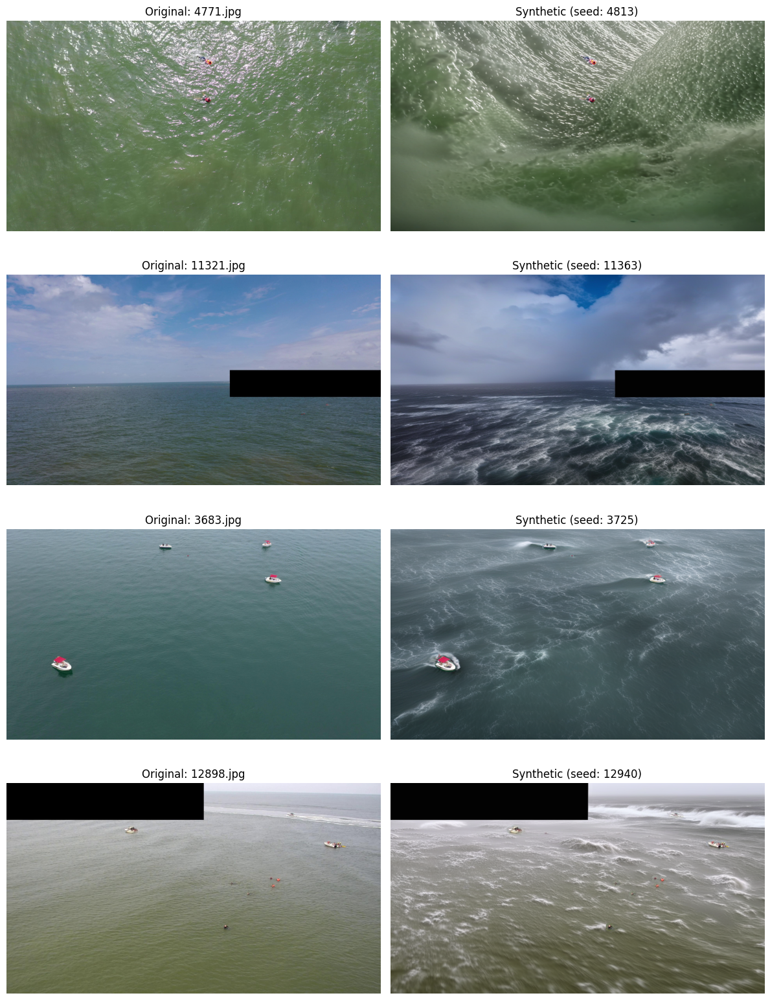


 Next Steps:
   1. Review sample images above for quality
   2. Run notebook 03_train_eval_compare to train models
   3. Compare baseline vs synthetic-augmented performance

    GENERATION COMPLETE!


In [ ]:
# ============================================================
# 16. Generation Summary & Statistics
# ============================================================
# Display comprehensive statistics and quality checks

# --- Configuration ---
NUM_SAMPLES_TO_DISPLAY = 4
SAMPLE_SEED = 40

print('='*60)
print('  GENERATION SUMMARY')
print('='*60)

# --- Load Manifests ---
train_manifest_path = SYNTHETIC_TRAIN / 'train_manifest.csv'
test_manifest_path = SYNTHETIC_TEST / 'test_manifest.csv'

train_df = pd.read_csv(train_manifest_path) if train_manifest_path.exists() else pd.DataFrame()
test_df = pd.read_csv(test_manifest_path) if test_manifest_path.exists() else pd.DataFrame()

# --- Basic Counts ---
print(f'\n Generated Images:')
print(f'   Train: {len(train_df):,} / {NUM_TRAIN_SYNTHETIC:,} ({100*len(train_df)/NUM_TRAIN_SYNTHETIC:.1f}%)')
print(f'   Test:  {len(test_df):,} / {NUM_TEST_SYNTHETIC:,} ({100*len(test_df)/NUM_TEST_SYNTHETIC:.1f}%)')
print(f'   Total: {len(train_df) + len(test_df):,}')

# --- Check for Duplicates ---
print(f'\n Duplicate Check:')
for name, df in [('Train', train_df), ('Test', test_df)]:
    if len(df) == 0: continue
    orig_dups = df['original_path'].duplicated().sum()
    synth_dups = df['synthetic_path'].duplicated().sum()
    if orig_dups == 0 and synth_dups == 0:
        print(f'   {name}:  No duplicates found')
    else:
        print(f'   {name}:  {orig_dups} original dups, {synth_dups} synthetic dups')

# --- Verify Files Exist ---
print(f'\n File Verification:')
for name, df, out_path in [('Train', train_df, SYNTHETIC_TRAIN), ('Test', test_df, SYNTHETIC_TEST)]:
    if len(df) == 0: continue
    existing_files = set(f.name for f in (out_path / 'images').glob('*.jpg'))
    manifest_files = set(Path(p).name for p in df['synthetic_path'])

    missing_in_folder = manifest_files - existing_files
    missing_in_csv = existing_files - manifest_files

    print(f'   {name}:')
    print(f'      Files in folder: {len(existing_files):,}')
    print(f'      Files in CSV:    {len(manifest_files):,}')
    if missing_in_folder:
        print(f'       Missing in folder: {len(missing_in_folder)}')
    if missing_in_csv:
        print(f'       Missing in CSV: {len(missing_in_csv)}')
    if not missing_in_folder and not missing_in_csv:
        print(f'       All files match!')

# --- Unique Seeds ---
print(f'\n Seed Statistics:')
for name, df in [('Train', train_df), ('Test', test_df)]:
    if len(df) == 0: continue
    unique_seeds = df['seed'].nunique()
    print(f'   {name}: {unique_seeds:,} unique seeds ({100*unique_seeds/len(df):.1f}% unique)')

# --- Storage Size ---
print(f'\n Storage:')
for name, out_path in [('Train', SYNTHETIC_TRAIN), ('Test', SYNTHETIC_TEST)]:
    images_path = out_path / 'images' if isinstance(out_path, Path) else SYNTHETIC_TEST / 'images'
    if images_path.exists():
        total_size = sum(f.stat().st_size for f in images_path.glob('*.jpg'))
        print(f'   {name}: {total_size / (1024**3):.2f} GB')

# --- Sample Visualization ---
print(f'\n Sample Results (seed={SAMPLE_SEED}):')
if len(train_df) > 0:
    sample_rows = train_df.sample(n=min(NUM_SAMPLES_TO_DISPLAY, len(train_df)), random_state=SAMPLE_SEED)
    fig, axes = plt.subplots(len(sample_rows), 2, figsize=(12, 4*len(sample_rows)))
    if len(sample_rows) == 1:
        axes = [axes]

    for idx, (_, row) in enumerate(sample_rows.iterrows()):
        orig_path = Path(row['original_path'].replace('/content/drive/MyDrive/StormVision', str(PROJECT_ROOT)))
        synth_path = Path(row['synthetic_path'].replace('/content/drive/MyDrive/StormVision', str(PROJECT_ROOT)))

        if orig_path.exists() and synth_path.exists():
            orig_img = Image.open(orig_path)
            synth_img = Image.open(synth_path)

            axes[idx][0].imshow(orig_img)
            axes[idx][0].set_title(f'Original: {orig_path.name}')
            axes[idx][0].axis('off')

            axes[idx][1].imshow(synth_img)
            axes[idx][1].set_title(f'Synthetic (seed: {row["seed"]})')
            axes[idx][1].axis('off')

    plt.tight_layout()
    plt.show()

# --- Next Steps ---
print(f'\n Next Steps:')
print(f'   1. Review sample images above for quality')
print(f'   2. Run notebook 03_train_eval_compare to train models')
print(f'   3. Compare baseline vs synthetic-augmented performance')

print('\n' + '='*60)
print('    GENERATION COMPLETE!')
print('='*60)

 ## SYNTHETIC DATA EDA

In [ ]:
# ============================================================
# SYNTHETIC DATA EDA - Full Statistics
# ============================================================
import pandas as pd
import numpy as np
from pathlib import Path
from PIL import Image
import os

# Paths
SYNTHETIC_PATH = Path('/content/drive/MyDrive/StormVision/data/synthetic')
SYNTHETIC_TRAIN = SYNTHETIC_PATH / 'train'
SYNTHETIC_TEST = SYNTHETIC_PATH / 'test'

print('='*70)
print(' SYNTHETIC DATA EDA')
print('='*70)

# ============================================================
# 1. CSV Statistics
# ============================================================
print('\n CSV STATISTICS:')
print('-'*50)

stats = {}
for name, folder in [('Train', SYNTHETIC_TRAIN), ('Test', SYNTHETIC_TEST)]:
    csv_path = folder / f'{name.lower()}_manifest.csv'
    if csv_path.exists():
        df = pd.read_csv(csv_path)
        stats[name] = {
            'csv_rows': len(df),
            'unique_seeds': df['seed'].nunique(),
            'seed_min': df['seed'].min(),
            'seed_max': df['seed'].max(),
            'zero_seeds': (df['seed'] == 0).sum(),
            'duplicates': df.duplicated().sum(),
        }
        print(f'\n  {name}:')
        print(f'    Rows:         {stats[name]["csv_rows"]:,}')
        print(f'    Unique seeds: {stats[name]["unique_seeds"]:,} ({100*stats[name]["unique_seeds"]/len(df):.1f}%)')
        print(f'    Seed range:   {stats[name]["seed_min"]:,} - {stats[name]["seed_max"]:,}')
        print(f'    Zero seeds:   {stats[name]["zero_seeds"]}')
        print(f'    Duplicates:   {stats[name]["duplicates"]}')
    else:
        print(f'\n  {name}: CSV not found!')

# ============================================================
# 2. Folder Statistics
# ============================================================
print('\n\n FOLDER STATISTICS:')
print('-'*50)

for name, folder in [('Train', SYNTHETIC_TRAIN), ('Test', SYNTHETIC_TEST)]:
    images_folder = folder / 'images'
    if images_folder.exists():
        files = list(images_folder.glob('*.jpg'))
        total_size = sum(f.stat().st_size for f in files)

        stats[name]['folder_count'] = len(files)
        stats[name]['total_size_gb'] = total_size / (1024**3)
        stats[name]['avg_size_mb'] = (total_size / len(files)) / (1024**2) if files else 0

        print(f'\n  {name}:')
        print(f'    Files:        {stats[name]["folder_count"]:,}')
        print(f'    Total size:   {stats[name]["total_size_gb"]:.2f} GB')
        print(f'    Avg per file: {stats[name]["avg_size_mb"]:.2f} MB')

        # Check sync
        csv_count = stats[name].get('csv_rows', 0)
        folder_count = stats[name]['folder_count']
        if csv_count == folder_count:
            print(f'    Sync status:   CSV matches folder')
        else:
            print(f'    Sync status:   CSV({csv_count}) ≠ Folder({folder_count})')

# ============================================================
# 3. Image Sample Analysis (first 10 images)
# ============================================================
print('\n\n IMAGE PROPERTIES (sample):')
print('-'*50)

for name, folder in [('Train', SYNTHETIC_TRAIN), ('Test', SYNTHETIC_TEST)]:
    images_folder = folder / 'images'
    if images_folder.exists():
        files = list(images_folder.glob('*.png'))[:10]
        if files:
            sizes = []
            dims = []
            for f in files:
                img = Image.open(f)
                dims.append(img.size)
                sizes.append(f.stat().st_size)

            widths = [d[0] for d in dims]
            heights = [d[1] for d in dims]

            print(f'\n  {name} (first 10):')
            print(f'    Width range:  {min(widths)} - {max(widths)}')
            print(f'    Height range: {min(heights)} - {max(heights)}')
            print(f'    Unique dims:  {len(set(dims))}')

# ============================================================
# 4. Train/Test Split Ratio
# ============================================================
print('\n\n SYNTHETIC SPLIT RATIO:')
print('-'*50)

train_count = stats.get('Train', {}).get('folder_count', 0)
test_count = stats.get('Test', {}).get('folder_count', 0)
total = train_count + test_count

if total > 0:
    print(f'\n  Train: {train_count:,} ({100*train_count/total:.1f}%)')
    print(f'  Test:  {test_count:,} ({100*test_count/total:.1f}%)')
    print(f'  Total: {total:,}')
    print(f'\n  Ratio: {train_count/test_count:.2f}:1 (Train:Test)' if test_count > 0 else '')

# ============================================================
# 5. Combined with Real Data
# ============================================================
print('\n\n COMBINED WITH REAL DATA:')
print('-'*50)

REAL_TRAIN = 8930  # תמונות אמיתיות
REAL_TEST = 1547

total_train = REAL_TRAIN + train_count
total_test = REAL_TEST + test_count

print(f'\n  TRAINING:')
print(f'    Real:      {REAL_TRAIN:,}')
print(f'    Synthetic: {train_count:,}')
print(f'    Total:     {total_train:,}')
print(f'    Synth %:   {100*train_count/total_train:.1f}%')

print(f'\n  TEST:')
print(f'    Real:      {REAL_TEST:,}')
print(f'    Synthetic: {test_count:,}')
print(f'    Total:     {total_test:,}')
print(f'    Synth %:   {100*test_count/total_test:.1f}%')

# ============================================================
# Summary
# ============================================================
print('\n\n' + '='*70)
print(' EDA COMPLETE')
print('='*70)

 SYNTHETIC DATA EDA

 CSV STATISTICS:
--------------------------------------------------

  Train:
    Rows:         4,131
    Unique seeds: 4,131 (100.0%)
    Seed range:   47 - 16,772
    Zero seeds:   0
    Duplicates:   0

  Test:
    Rows:         1,547
    Unique seeds: 1,546 (99.9%)
    Seed range:   90 - 98,196
    Zero seeds:   0
    Duplicates:   0


 FOLDER STATISTICS:
--------------------------------------------------

  Train:
    Files:        4,131
    Total size:   23.77 GB
    Avg per file: 5.89 MB
    Sync status:   CSV matches folder

  Test:
    Files:        1,547
    Total size:   8.80 GB
    Avg per file: 5.82 MB
    Sync status:   CSV matches folder


 IMAGE PROPERTIES (sample):
--------------------------------------------------

  Train (first 10):
    Width range:  1230 - 3840
    Height range: 933 - 2160
    Unique dims:  4

  Test (first 10):
    Width range:  3632 - 5456
    Height range: 2160 - 5456
    Unique dims:  3


 SYNTHETIC SPLIT RATIO:
-----------